In [1]:
!pip install copent

In [1]:
!pip install GPy

Defaulting to user installation because normal site-packages is not writeable
     ---------------------------------------- 0.0/1.6 MB ? eta -:--:--
     -- ------------------------------------- 0.1/1.6 MB 1.7 MB/s eta 0:00:01
     ------- -------------------------------- 0.3/1.6 MB 3.2 MB/s eta 0:00:01
     ----------------- ---------------------- 0.7/1.6 MB 5.0 MB/s eta 0:00:01
     ---------------------------------------  1.6/1.6 MB 8.7 MB/s eta 0:00:01
     ---------------------------------------- 1.6/1.6 MB 8.0 MB/s eta 0:00:00
     ---------------------------------------- 0.0/103.2 kB ? eta -:--:--
     -------------------------------------- 103.2/103.2 kB 5.8 MB/s eta 0:00:00



[notice] A new release of pip is available: 23.0 -> 24.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import time
import GPy
import warnings
warnings.filterwarnings('ignore')

import statsmodels.api as sm
from statsmodels.tsa.stattools import adfuller, grangercausalitytests
from statsmodels.stats.diagnostic import acorr_ljungbox
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.seasonal import STL
from statsmodels.tsa.statespace.sarimax import SARIMAX
from statsmodels.tsa.statespace.varmax import VARMAX
from copent import transent

from sklearn.preprocessing import MinMaxScaler, StandardScaler
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from sklearn.model_selection import train_test_split, ParameterGrid
from sklearn.gaussian_process import GaussianProcessRegressor

import tensorflow as tf
import keras.layers as layers

import torch
from torch import nn, optim

from itertools import product
import pickle as pkl
from tqdm.notebook import tqdm

%matplotlib inline

In [ ]:
strategy = tf.distribute.MirroredStrategy()

## Import data and preprocessing

In [4]:
data = pd.read_csv('/kaggle/input/weather-data-munich-1954-2022/weatherdata.csv', sep=';')
data.columns = data.columns.str.strip()
data.head()

,STATIONS_ID,MESS_DATUM,QN_3,FX,FM,QN_4,RSK,RSKF,SDK,SHK_TAG,NM,VPM,PM,TMK,UPM,TXK,TNK,TGK,eor
0,3379,19540601,-999,-999.0,-999.0,1,0.0,1,-999.0,0,-999.0,-999.0,-999.0,14.0,-999.0,17.6,10.4,-999.0,eor
1,3379,19540602,-999,-999.0,-999.0,1,0.5,1,-999.0,0,-999.0,-999.0,-999.0,13.2,-999.0,19.7,9.7,-999.0,eor
2,3379,19540603,-999,-999.0,-999.0,1,0.0,1,-999.0,0,-999.0,-999.0,-999.0,16.6,-999.0,21.9,8.2,-999.0,eor
3,3379,19540604,-999,-999.0,-999.0,1,1.2,1,-999.0,0,-999.0,-999.0,-999.0,15.2,-999.0,17.3,11.8,-999.0,eor
4,3379,19540605,-999,-999.0,-999.0,1,6.0,1,-999.0,0,-999.0,-999.0,-999.0,15.2,-999.0,17.7,13.7,-999.0,eor


In [5]:
data['MESS_DATUM'] = data['MESS_DATUM'].astype(str)
data['MESS_DATUM'] = data['MESS_DATUM'].apply(lambda x: x[-2:] + '/' +  x[-4:-2] + '/' + x[:4])
data['MESS_DATUM'] = pd.to_datetime(data['MESS_DATUM'], format="%d/%m/%Y")
data['MESS_DATUM'].head()

0   1954-06-01
1   1954-06-02
2   1954-06-03
3   1954-06-04
4   1954-06-05
Name: MESS_DATUM, dtype: datetime64[ns]

In [6]:
data.describe()

,STATIONS_ID,MESS_DATUM,QN_3,FX,FM,QN_4,RSK,RSKF,SDK,SHK_TAG,NM,VPM,PM,TMK,UPM,TXK,TNK,TGK
count,25051.0,25051,25051.000000,25051.000000,25051.000000,25051.000000,25051.000000,25051.000000,25051.000000,25051.000000,25051.000000,25051.000000,25051.000000,25051.000000,25051.000000,25051.000000,25051.000000,25051.000000
mean,3379.0,1988-09-15 00:00:00,-440.069458,-443.776775,-446.922051,5.661530,2.627951,2.686679,-7.370731,-61.539899,-443.378979,-440.455842,83.229992,9.612083,-405.123415,13.828729,5.658369,-443.437691
min,3379.0,1954-06-01 00:00:00,-999.000000,-999.000000,-999.000000,1.000000,0.000000,0.000000,-999.000000,-999.000000,-999.000000,-999.000000,-999.000000,-20.000000,-999.000000,-17.900000,-25.400000,-999.000000
25%,3379.0,1971-07-24 12:00:00,-999.000000,-999.000000,-999.000000,1.000000,0.000000,0.000000,0.400000,0.000000,-999.000000,-999.000000,-999.000000,3.400000,-999.000000,6.700000,0.500000,-999.000000
50%,3379.0,1988-09-15 00:00:00,10.000000,4.900000,1.200000,9.000000,0.000000,1.000000,3.900000,0.000000,1.300000,4.700000,945.000000,9.900000,54.000000,14.200000,5.900000,-4.200000
75%,3379.0,2005-11-07 12:00:00,10.000000,8.900000,2.400000,10.000000,2.600000,6.000000,8.300000,0.000000,6.200000,9.500000,956.400000,15.800000,76.000000,20.900000,11.400000,6.200000
max,3379.0,2022-12-31 00:00:00,10.000000,38.600000,11.000000,10.000000,101.600000,8.000000,15.717000,55.000000,8.000000,21.500000,979.600000,30.400000,100.000000,37.500000,22.600000,21.400000
std,0.0,NaN,501.479739,501.633240,498.138980,4.318503,5.911350,2.880991,110.177292,242.190168,499.278507,501.344036,971.398000,7.908055,533.140985,9.013736,7.036732,499.129425


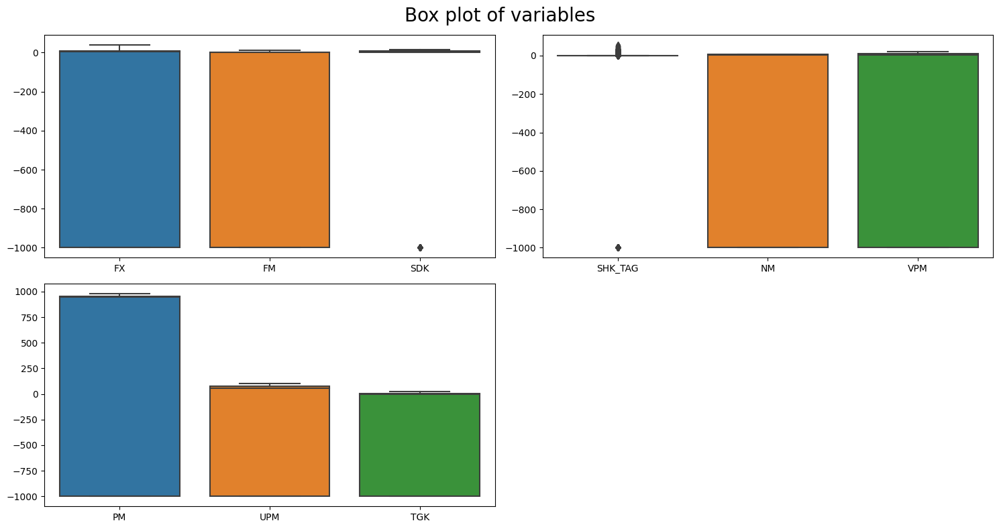

In [7]:
plt.figure(figsize=(15, 8))
plt.suptitle('Box plot of variables', fontsize=20)

plt.subplot(2, 2, 1)
sns.boxplot(data[['FX', 'FM', 'SDK']])

plt.subplot(2, 2, 2)
sns.boxplot(data[['SHK_TAG', 'NM', 'VPM']])

plt.subplot(2, 2, 3)
sns.boxplot(data[['PM', 'UPM', 'TGK']])

plt.tight_layout()
plt.show()

In [8]:
data['FM'].replace(-999, -1, inplace=True)
data['PM'].replace(-999, -1, inplace=True)
data['VPM'].replace(-999, -1, inplace=True)
data['UPM'].replace(-999, -1, inplace=True)
data['FX'].replace(-999, -1, inplace=True)
data['SDK'].replace(-999, -1, inplace=True)
data['NM'].replace(-999, -1, inplace=True)
data['TGK'].replace(-999, -1, inplace=True)

data.drop(columns=['QN_3', 'SHK_TAG', 'STATIONS_ID', 'QN_4', 'RSK', 'RSKF', 'eor'], inplace=True)

data.describe()

,MESS_DATUM,FX,FM,SDK,NM,VPM,PM,TMK,UPM,TXK,TNK,TGK
count,25051,25051.000000,25051.000000,25051.000000,25051.000000,25051.000000,25051.000000,25051.000000,25051.000000,25051.000000,25051.000000,25051.000000
mean,1988-09-15 00:00:00,4.727636,0.944940,4.780082,2.456237,4.821632,528.507466,9.612083,40.154059,13.828729,5.658369,2.278009
min,1954-06-01 00:00:00,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-20.000000,-1.000000,-17.900000,-25.400000,-23.500000
25%,1971-07-24 12:00:00,-1.000000,-1.000000,0.400000,-1.000000,-1.000000,-1.000000,3.400000,-1.000000,6.700000,0.500000,-1.000000
50%,1988-09-15 00:00:00,4.900000,1.200000,3.900000,1.300000,4.700000,945.000000,9.900000,54.000000,14.200000,5.900000,-1.000000
75%,2005-11-07 12:00:00,8.900000,2.400000,8.300000,6.200000,9.500000,956.400000,15.800000,76.000000,20.900000,11.400000,6.200000
max,2022-12-31 00:00:00,38.600000,11.000000,15.717000,8.000000,21.500000,979.600000,30.400000,100.000000,37.500000,22.600000,21.400000
std,NaN,6.076875,1.993331,4.383838,3.570336,6.036319,475.305209,7.908055,38.251542,9.013736,7.036732,6.027918


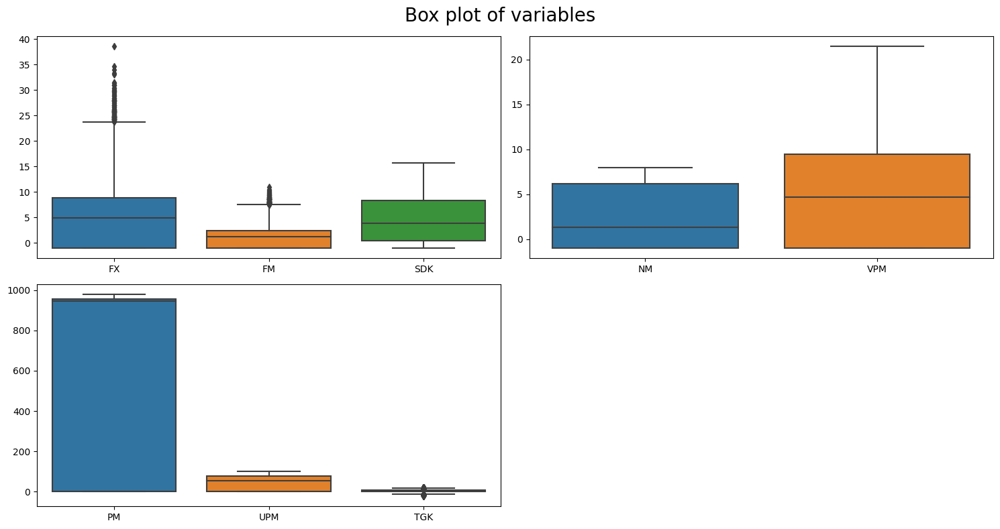

In [9]:
plt.figure(figsize=(15, 8))
plt.suptitle('Box plot of variables', fontsize=20)

plt.subplot(2, 2, 1)
sns.boxplot(data[['FX', 'FM', 'SDK']])

plt.subplot(2, 2, 2)
sns.boxplot(data[['NM', 'VPM']])

plt.subplot(2, 2, 3)
sns.boxplot(data[['PM', 'UPM', 'TGK']])

plt.tight_layout()
plt.show()

In [10]:
#data.to_csv('weather.csv')

In [11]:
df_2020 = data[data['MESS_DATUM'] >= '01/01/2018'].reset_index(drop=True)

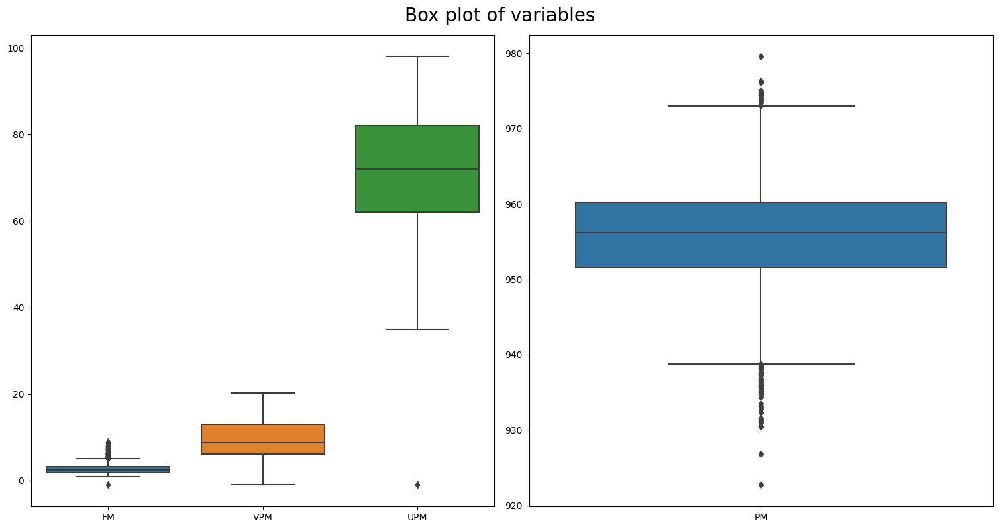

In [12]:
plt.figure(figsize=(15, 8))
plt.suptitle('Box plot of variables', fontsize=20)

plt.subplot(1, 2, 1)
sns.boxplot(df_2020[['FM', 'VPM', 'UPM']])

plt.subplot(1, 2, 2)
sns.boxplot(df_2020[['PM']])

plt.tight_layout()
plt.show()

## Data visualization

In [13]:
def plot_ts(data, label):
    sns.lineplot(data=data, x='MESS_DATUM', y=label)
    plt.title(label)
    plt.ylabel('')
    plt.xlabel('')

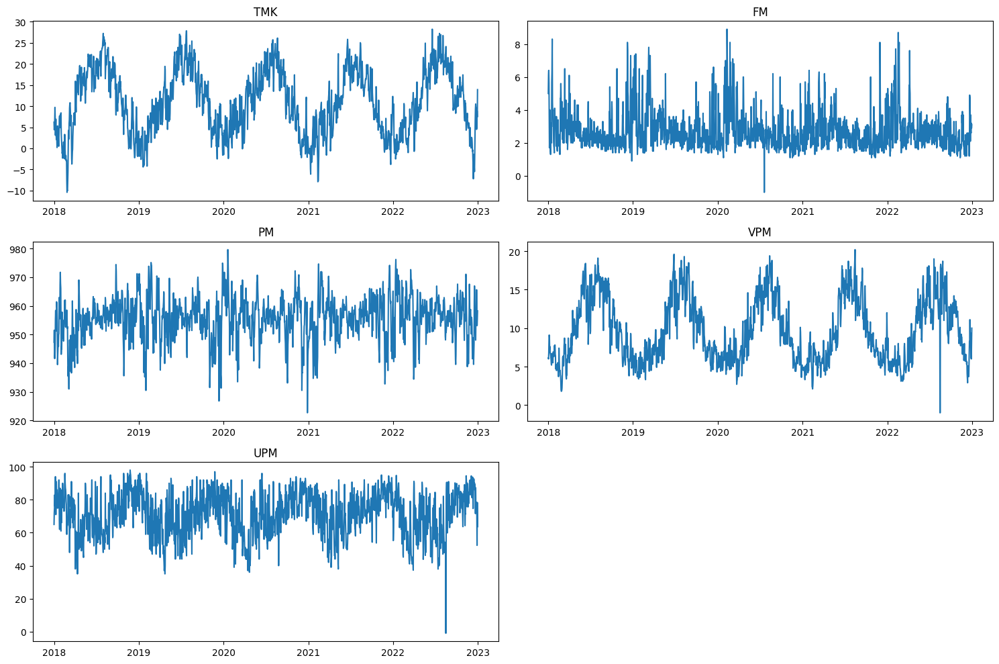

In [14]:
plt.figure(figsize=(15, 10))

cols = ['TMK', 'FM', 'PM', 'VPM', 'UPM']

for i in range(5):
    plt.subplot(3, 2, i + 1)
    plot_ts(df_2020, cols[i])

plt.tight_layout()
plt.show()

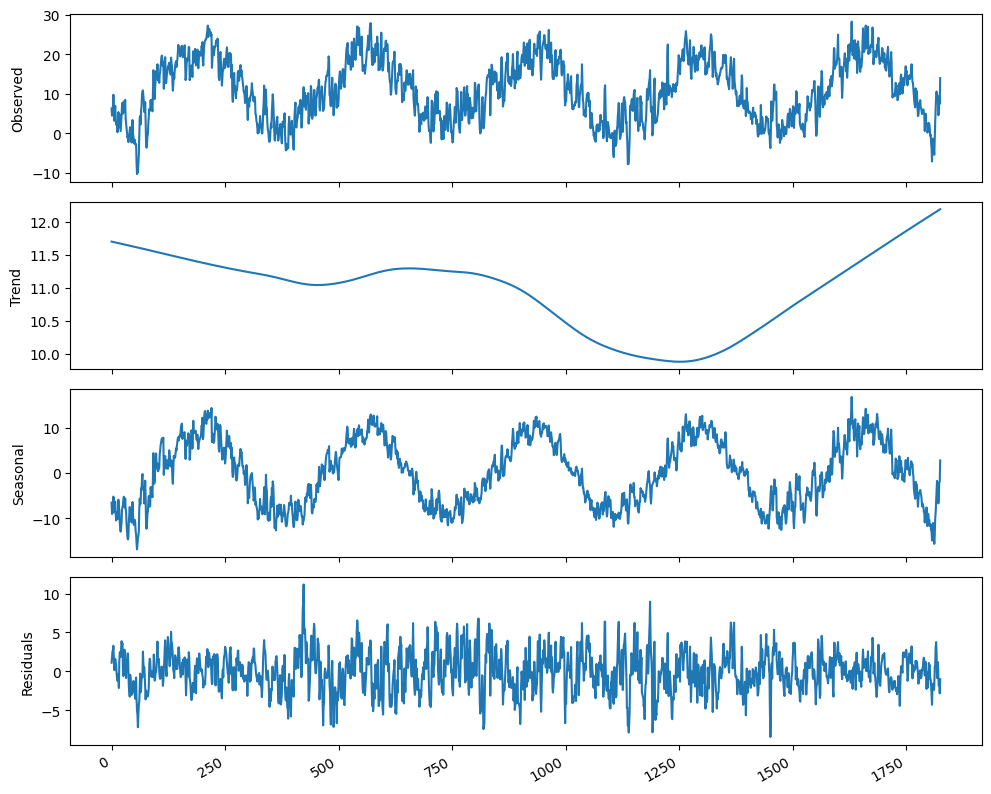

In [15]:
decomposition = STL(df_2020['TMK'], period=365).fit()

fig, (ax1, ax2, ax3, ax4) = plt.subplots(nrows=4, ncols=1, sharex=True, figsize=(10,8))

ax1.plot(decomposition.observed)
ax1.set_ylabel('Observed')

ax2.plot(decomposition.trend)
ax2.set_ylabel('Trend')

ax3.plot(decomposition.seasonal)
ax3.set_ylabel('Seasonal')

ax4.plot(decomposition.resid)
ax4.set_ylabel('Residuals')

fig.autofmt_xdate()
plt.tight_layout()

## Split & Scale data

In [16]:
print(len(df_2020))
print(len(df_2020) * 0.8)

1826
1460.8000000000002


In [17]:
train_df = df_2020[:1460].drop(columns=['MESS_DATUM']).reset_index(drop=True)
test_df = df_2020[1460:].drop(columns=['MESS_DATUM']). reset_index(drop=True)

In [18]:
scalers={}

scaled_train = train_df.copy()
for i in train_df.columns:
    scaler = MinMaxScaler(feature_range=(-1, 1))
    s_s = scaler.fit_transform(scaled_train[i].values.reshape(-1,1))
    s_s = np.reshape(s_s,len(s_s))
    scalers['scaler_'+ i] = scaler
    scaled_train[i]=s_s
    
scaled_test = test_df.copy()
for i in test_df.columns:
    scaler = scalers['scaler_'+i]
    s_s = scaler.transform(scaled_test[i].values.reshape(-1,1))
    s_s=np.reshape(s_s,len(s_s))
    scalers['scaler_'+i] = scaler
    scaled_test[i]=s_s

## SARIMAX

### Find the optimize hyperparameters

In [ ]:
def optimize_SARIMAX(endog, exog, order_list, d, D, s):
    results = []
    for order in tqdm(order_list):
        try:
            model = SARIMAX(
                endog, exog, 
                order=(order[0], d, order[1]), 
                seasonal_order=(order[2], D, order[3], s), 
                simple_differencing=False
            ).fit(disp=False)
            aic = model.aic
            results.append([order, aic])
        except:
            continue
    result_df = pd.DataFrame(results, columns=['(p,q,P,Q)', 'AIC'])
    result_df = result_df.sort_values(by='AIC', ascending=True).reset_index(drop=True)
    return result_df

In [ ]:
p = range(1, 3, 1)
d = 1
q = range(1, 3, 1)
P = range(1, 3, 1)
D = 0
Q = range(1, 3, 1)
s = 365

parameters = list(product(p, q, P, Q))

In [ ]:
def recursive_forecast(endog, exog, train_len, horizon, window, order, seasonal_order):
    pred_SARIMAX = []
    for i in range(train_len, train_len + horizon, window):
        try:
            model = SARIMAX(endog[:i], exog[:i], 
                            order=order, 
                            seasonal_order=seasonal_order, 
                            simple_differencing=False)
            res = model.fit(disp=False)
            predictions = res.get_prediction(exog=exog[i:i + window])
            oos_pred = predictions.predicted_mean.iloc[:window]
            pred_SARIMAX.extend(oos_pred)
        except:
            pred_SARIMAX.extend([np.nan] * window)
    return pred_SARIMAX[:horizon]

### Model training

In [ ]:
metrics = []
prediction_SARIMAX = []

# Loop through each variable as the target
for target_col in scaled_train.columns:
    target = scaled_train[target_col]
    exog = scaled_train.drop(columns=[target_col])

    # Find best parameters for the SARIMAX model
    result_df = optimize_SARIMAX(target, exog, parameters, d, D, s)
    best_order = result_df.iloc[0]['(p,q,P,Q)']
    
    # Train SARIMAX with best parameters
    start = time.time()
    best_model = SARIMAX(target, exog, 
                         order=(best_order[0], d, best_order[1]), 
                         seasonal_order=(best_order[2], D, best_order[3], s), 
                         simple_differencing=False)
    best_model_fit = best_model.fit(disp=False)
    end = time.time()
    
    # Forecast on the test set
    target_test = scaled_test[target_col]
    exog_test = scaled_test.drop(columns=[target_col])
    train_len = len(target)
    horizon = len(target_test)
    window = 90
    
    pred_SARIMAX = recursive_forecast(target, exog, train_len, horizon, window, 
                                      (best_order[0], d, best_order[1]), 
                                      (best_order[2], D, best_order[3], s))
        
    # Compute performance metrics
    mse = mean_squared_error(target_test, pred_SARIMAX, squared=True)
    rmse = mean_squared_error(target_test, pred_SARIMAX, squared=False)
    mae = mean_absolute_error(target_test, pred_SARIMAX)
    r2 = r2_score(target_test, pred_SARIMAX)

    # Unscale predictions
    scaler = scalers[f'scaler_{target_col}']
    unscaled_SARIMAX = scaler.inverse_transform(
        np.array(pred_SARIMAX[:horizon]).reshape(-1, 1)
    )
    prediction_SARIMAX.append(unscaled_SARIMAX)
    
    # Unscaled target
    real_values = df_2020.loc[1460:, target_col].values  # Adjust index as needed
    
    # Compute unscaled metrics
    unscale_mse = mean_squared_error(real_values, unscaled_SARIMAX)
    unscale_rmse = mean_squared_error(real_values, unscaled_SARIMAX, squared=False)
    unscale_mae = mean_absolute_error(real_values, unscaled_SARIMAX)
    
    # Store metrics
    metrics.append({
        'Variable': target_col,
        'Best Order': best_order,
        'MSE': mse,
        'RMSE': rmse,
        'MAE': mae,
        'Unscale MSE': unscale_mse,
        'Unscale RMSE': unscale_rmse,
        'Unscale MAE': unscale_mae,
        'R2': r2,
        'Time': end-start
    })

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

  0%|          | 0/16 [00:00<?, ?it/s]

In [ ]:
metrics_df = pd.DataFrame(metrics)
print(metrics_df)

   Variable    Best Order       MSE      RMSE       MAE  Unscale MSE  \
0        FX  (1, 1, 1, 1)  0.136510  0.369473  0.275420    39.451405   
1        FM  (1, 1, 1, 1)  0.111330  0.333662  0.250099     2.727868   
2       SDK  (1, 1, 1, 1)  0.674310  0.821164  0.662703    41.552694   
3        NM  (1, 1, 1, 1)  0.456367  0.675549  0.510414     9.241429   
4       VPM  (1, 2, 1, 1)  0.428600  0.654675  0.521916    36.276685   
5        PM  (1, 2, 1, 1)  0.176534  0.420159  0.350333   142.886890   
6       TMK  (2, 2, 1, 2)  0.432279  0.657479  0.541855   157.699697   
7       UPM  (2, 1, 1, 1)  0.383699  0.619435  0.480004   380.725533   
8       TXK  (1, 1, 1, 1)  0.468080  0.684163  0.565239   220.414011   
9       TNK  (2, 1, 1, 1)  0.370159  0.608407  0.495078   112.069204   
10      TGK  (2, 1, 1, 1)  0.408300  0.638983  0.517184   122.907428   

    Unscale RMSE  Unscale MAE        R2        Time  
0       6.281035     4.682144 -1.189882   77.663679  
1       1.651626     1.2379

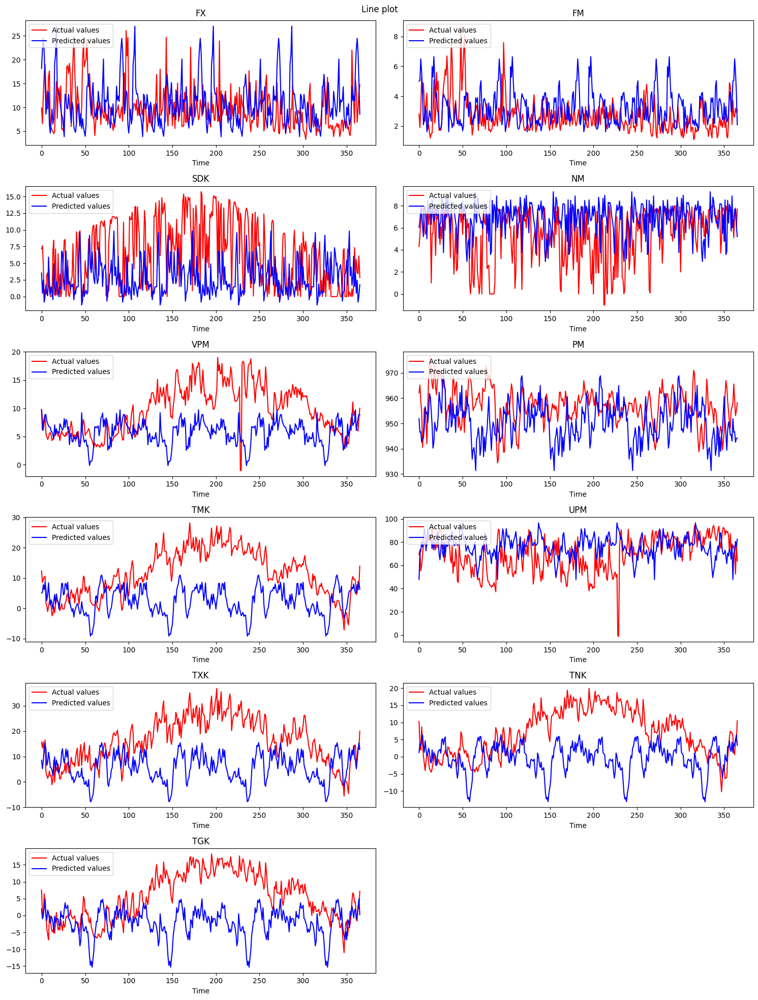

In [ ]:
plt.figure(figsize=(15, 20))
prediction_SARIMAX = np.array(prediction_SARIMAX)
for i in range(11):
    plt.subplot(6, 2, i + 1)  
    plt.plot(test_df.index, test_df.iloc[:, i], 'r-', markersize=10, label='Actual values')
    plt.plot(test_df.index, prediction_SARIMAX[i], 'b-', label='Predicted values')
    plt.xlabel('Time')
    plt.title(f'{test_df.columns[i]}')
    plt.legend(loc='upper left')

plt.suptitle('Line plot')
plt.tight_layout()
plt.show()

## Gaussian Process

In [42]:
statistic = []
p_value = []
for i in range(11):
    ad_fuller_result = adfuller(scaled_train[scaled_train.columns[i]])
    statistic.append(ad_fuller_result[0])
    p_value.append(round(ad_fuller_result[1], 5))
    
ADF_res = pd.DataFrame({'Statistic': statistic, 'P-value': p_value}, index=scaled_train.columns)
ADF_res

,Statistic,P-value
FX,-6.830838,0.00000
FM,-8.127475,0.00000
SDK,-3.784396,0.00307
NM,-7.663985,0.00000
VPM,-2.536297,0.10689
PM,-12.241508,0.00000
TMK,-2.629805,0.08699
UPM,-3.422825,0.01020
TXK,-2.883903,0.04725
TNK,-2.502936,0.11476


In [43]:
diff_data = scaled_train.diff()
diff_data = diff_data.iloc[1:, :]

statistic = []
p_value = []
for i in range(11):
    ad_fuller_result = adfuller(diff_data[diff_data.columns[i]])
    statistic.append(ad_fuller_result[0])
    p_value.append(round(ad_fuller_result[1], 5))
    
ADF_res = pd.DataFrame({'Statistic': statistic, 'P-value': p_value}, index=diff_data.columns)
ADF_res

,Statistic,P-value
FX,-12.580669,0.0
FM,-12.515880,0.0
SDK,-12.764731,0.0
NM,-13.270070,0.0
VPM,-14.361195,0.0
PM,-13.843815,0.0
TMK,-15.058108,0.0
UPM,-12.554024,0.0
TXK,-15.218893,0.0
TNK,-15.334696,0.0


### Define model and training

In [44]:
train_Gaussian = diff_data
test_Gaussian = scaled_test

In [45]:
X_train = train_Gaussian.index.values.reshape(-1, 1)
y_train = train_Gaussian.values

X_test = test_Gaussian.index.values.reshape(-1, 1)
y_test = test_Gaussian.values

print(X_train.shape, y_train.shape, X_test.shape, y_test.shape)

(1459, 1) (1459, 11) (366, 1) (366, 11)


In [ ]:
gp_models = []

start = time.time()
for i in range(11):
    y_train_single = y_train[:, i].reshape(-1, 1)

    kernel = (
        GPy.kern.RBF(input_dim=1, lengthscale=90.0) * GPy.kern.PeriodicExponential(input_dim=1, period=1., lengthscale=1.0) +
        GPy.kern.RBF(input_dim=1, lengthscale=3.0) + GPy.kern.RatQuad(input_dim=1, lengthscale=7.0, power=1.0)
    )

    model = GPy.models.GPRegression(X_train, y_train_single, kernel)

    model.optimize(messages=True)
    
    gp_models.append(model)
end = time.time()
print(end-start)

621.4030344486237


In [51]:
def unscale(data):
    temp = data.copy()
    for index, i in enumerate(train_df.columns):
        scaler = scalers['scaler_' + i]
        temp[:, index] = scaler.inverse_transform(np.reshape(data[:, index], (-1, 1))).flatten()
    return temp

In [ ]:
predictions = []
sigma = []

for i, model in enumerate(gp_models):
    mean, variance = model.predict(X_test)
    predictions.append(mean)
    sigma.append(variance)

predictions = np.hstack(predictions)
sigma = np.hstack(sigma)

In [ ]:
last_value = scaled_train.iloc[-1, :].values
y_pred = predictions.cumsum(axis=0) + last_value

In [53]:
y_pred_unscale = unscale(y_pred)
sigma_unscale = unscale(sigma)

In [ ]:
pred_scaled_Gau = pd.DataFrame(data=y_pred, columns=df_2020.drop(columns=['MESS_DATUM']).columns)
pred_scaled_Gau.head()

,FX,FM,SDK,NM,VPM,PM,TMK,UPM,TXK,TNK,TGK
0,-0.152940,0.151515,-0.955414,0.933333,0.254609,0.234457,0.071766,0.748725,0.004153,0.397684,0.463977
1,-0.152939,0.151515,-0.955414,0.933333,0.277355,0.238227,0.008730,0.927671,-0.000989,0.393747,0.463977
2,-0.152937,0.151515,-0.955414,0.933334,0.369844,0.256709,0.080636,1.074622,0.002382,0.384668,0.463977
3,-0.152937,0.151515,-0.955414,0.933334,0.439160,0.275627,0.121227,1.208840,0.003533,0.385283,0.463977
4,-0.152937,0.151515,-0.955414,0.933334,0.494227,0.260430,0.122622,1.315944,0.012707,0.392096,0.463977


In [ ]:
pred_Gau = pd.DataFrame(y_pred_unscale, columns=df_2020.drop(columns=['MESS_DATUM']).columns)
pred_Gau.head()

,FX,FM,SDK,NM,VPM,PM,TMK,UPM,TXK,TNK,TGK
0,13.400017,4.7,0.350000,7.700000,13.342403,957.820304,10.070728,90.084852,13.690123,10.919706,10.0
1,13.400039,4.7,0.350000,7.700001,13.551670,957.927551,8.866739,95.721621,13.578549,10.851202,10.0
2,13.400064,4.7,0.350001,7.700001,14.402568,958.453372,10.240145,100.350598,13.651690,10.693224,10.0
3,13.400072,4.7,0.350002,7.700001,15.040273,958.991601,11.015438,104.578453,13.676670,10.703929,10.0
4,13.400064,4.7,0.350003,7.700001,15.546887,958.559248,11.042078,107.952223,13.875745,10.822473,10.0


### Model Evaluation
#### Scaled data

In [ ]:
for i in range(11):
    print(f'MSE for {scaled_test.columns[i]}: {mean_squared_error(scaled_test.iloc[:, i], pred_scaled_Gau.iloc[:, i])}')
    
print(f'MSE total: {mean_squared_error(scaled_test, pred_scaled_Gau)}')

MSE for FX: 0.10633475093639602
MSE for FM: 0.2177875274571904
MSE for SDK: 0.9397055907234012
MSE for NM: 0.5341915323089267
MSE for VPM: 0.7909276267325385
MSE for PM: 0.06458982192621864
MSE for TMK: 0.11352415014123164
MSE for UPM: 0.9796607320972487
MSE for TXK: 0.1830140223525678
MSE for TNK: 0.19684110152950351
MSE for TGK: 0.2211232050340222
MSE total: 0.3952454601126586


In [ ]:
for i in range(11):
    print(f'RMSE for {scaled_test.columns[i]}: {mean_squared_error(scaled_test.iloc[:, i], pred_scaled_Gau.iloc[:, i], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(scaled_test, pred_scaled_Gau, squared=False)}')

RMSE for FX: 0.3260900963482271
RMSE for FM: 0.4666771126348392
RMSE for SDK: 0.9693841296015739
RMSE for NM: 0.7308840758348253
RMSE for VPM: 0.8893411194432306
RMSE for PM: 0.2541452772062047
RMSE for TMK: 0.3369334506118851
RMSE for UPM: 0.989778122660452
RMSE for TXK: 0.4278013818965149
RMSE for TNK: 0.44366778283925856
RMSE for TGK: 0.4702373922116596
RMSE total: 0.5731763582989701


In [ ]:
for i in range(11):
    print(f'MAE for {scaled_test.columns[i]}: {mean_absolute_error(scaled_test.iloc[:, i], pred_scaled_Gau.iloc[:, i])}')
    
print(f'MAE total: {mean_absolute_error(scaled_test, pred_scaled_Gau)}')

MAE for FX: 0.288123747392246
MAE for FM: 0.4370480803831297
MAE for SDK: 0.762205816300117
MAE for NM: 0.5141469896407438
MAE for VPM: 0.8345923291468729
MAE for PM: 0.19201774202404245
MAE for TMK: 0.2722889110216979
MAE for UPM: 0.8814393039169137
MAE for TXK: 0.3567336109511736
MAE for TNK: 0.36621802507654805
MAE for TGK: 0.3887497834394462
MAE total: 0.4812331217539027


#### Unscaled data

In [ ]:
for i in range(11):
    print(f'MSE for {scaled_test.columns[i]}: {mean_squared_error(test_df.iloc[:, i], pred_Gau.iloc[:, i])}')
    
print(f'MSE total: {mean_squared_error(test_df, pred_Gau)}')

MSE for FX: 30.730743020618448
MSE for FM: 5.336338891519808
MSE for SDK: 57.90700776435279
MSE for NM: 10.817378529255766
MSE for VPM: 66.94411432664204
MSE for PM: 52.27916334163615
MSE for TMK: 41.41474521302273
MSE for UPM: 972.0683614234952
MSE for TXK: 86.17947298560067
MSE for TNK: 59.59561189907248
MSE for TGK: 66.56305998735395
MSE total: 131.80327248932454


In [ ]:
for i in range(11):
    print(f'RMSE for {scaled_test.columns[i]}: {mean_squared_error(test_df.iloc[:, i], pred_Gau.iloc[:, i], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(test_df, pred_Gau, squared=False)}')

RMSE for FX: 5.54353163791986
RMSE for FM: 2.310051707542454
RMSE for SDK: 7.609665417372356
RMSE for NM: 3.288978341256714
RMSE for VPM: 8.18193829887772
RMSE for PM: 7.230433136516522
RMSE for TMK: 6.435428906687007
RMSE for UPM: 31.17801086380424
RMSE for TXK: 9.283289987154374
RMSE for TNK: 7.719819421403099
RMSE for TGK: 8.158618754872295
RMSE total: 8.812706043036966


In [ ]:
for i in range(11):
    print(f'MAE for {scaled_test.columns[i]}: {mean_absolute_error(test_df.iloc[:, i], pred_Gau.iloc[:, i])}')
    
print(f'MAE total: {mean_absolute_error(test_df, pred_Gau)}')

MAE for FX: 4.8981037056681815
MAE for FM: 2.1633879978964923
MAE for SDK: 5.9833156579559175
MAE for NM: 2.313661453383347
MAE for VPM: 7.678249428151231
MAE for PM: 5.462904760584005
MAE for TMK: 5.20071820051443
MAE for UPM: 27.765338073382786
MAE for TXK: 7.741119357640465
MAE for TNK: 6.372193636331937
MAE for TGK: 6.744808742674391
MAE total: 7.483981910380286


In [ ]:
for i in range(11):
    print(f'R2 for {scaled_test.columns[i]}: {r2_score(test_df.iloc[:, i], pred_Gau.iloc[:, i])}')
    
print(f'R2 total: {r2_score(test_df, pred_Gau)}')

R2 for FX: -0.7058127091370614
R2 for FM: -3.0870215137555084
R2 for SDK: -1.5029073638331272
R2 for NM: -0.9087676004819369
R2 for VPM: -2.9292711057467744
R2 for PM: -0.059000508876208
R2 for TMK: 0.28376717281995156
R2 for UPM: -3.330754424840787
R2 for TXK: -0.08458187712477794
R2 for TNK: -0.3598316403142856
R2 for TGK: -0.41738501604794065
R2 total: -1.1910515079398591


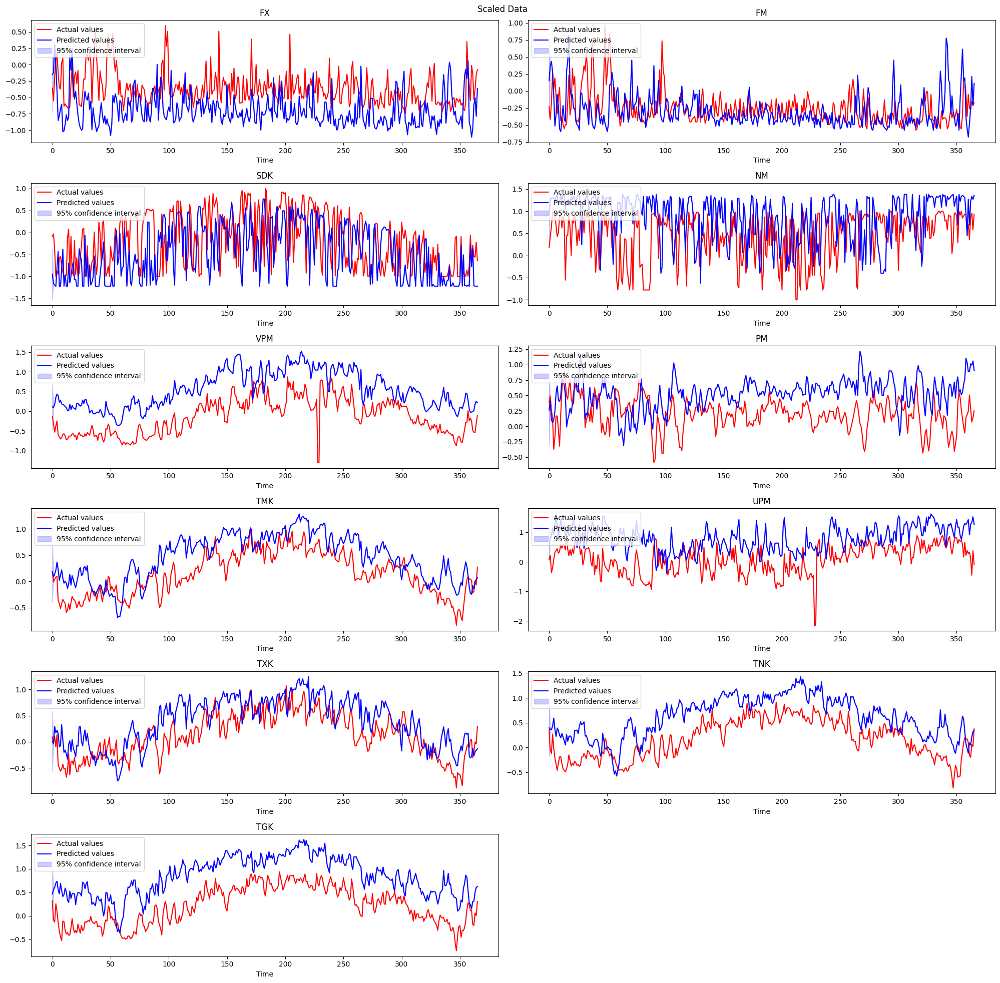

In [ ]:
plt.figure(figsize=(20, 20))
for i in range(11):
    plt.subplot(6, 2, i + 1)  
    plt.plot(X_test, y_test[:, i], 'r-', markersize=10, label='Actual values')
    plt.plot(X_test, y_pred[:, i], 'b-', label='Predicted values')
    plt.fill_between(X_test.flatten(), y_pred[:, i] - 1.96 * sigma[:, i], y_pred[:, i] + 1.96 * sigma[:, i], alpha=0.2, color='blue', label='95% confidence interval')
    plt.xlabel('Time')
    plt.title(f'{scaled_test.columns[i]}')
    plt.legend(loc='upper left')

plt.suptitle('Scaled Data')
plt.tight_layout()
plt.show()

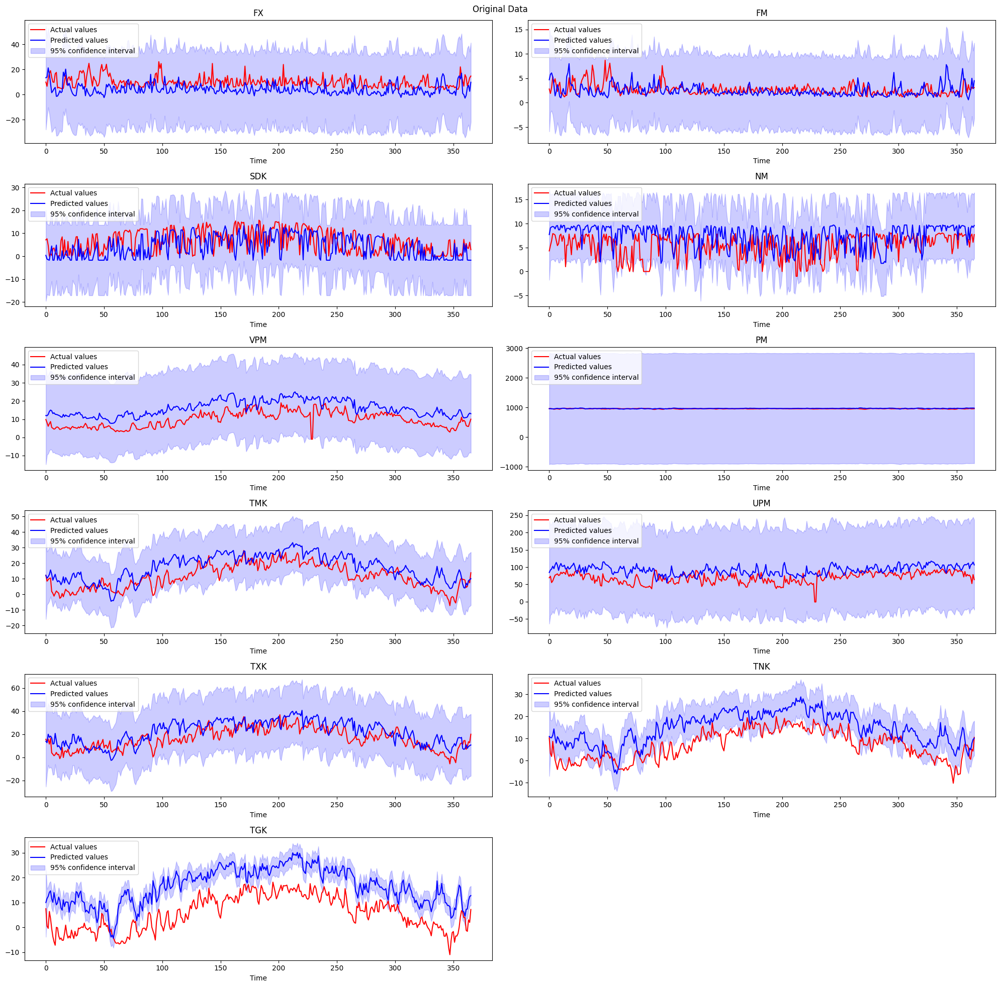

In [ ]:
plt.figure(figsize=(20, 20))
for i in range(11):
    plt.subplot(6, 2, i + 1)  
    plt.plot(X_test, test_df.iloc[:, i], 'r-', markersize=10, label='Actual values')
    plt.plot(X_test, pred_Gau.iloc[:, i], 'b-', label='Predicted values')
    plt.fill_between(X_test.flatten(), pred_Gau.iloc[:, i] - 1.96 * sigma_unscale[:, i], pred_Gau.iloc[:, i] + 1.96 * sigma_unscale[:, i], alpha=0.2, color='blue', label='95% confidence interval')
    plt.xlabel('Time')
    plt.title(f'{scaled_test.columns[i]}')
    plt.legend(loc='upper left')

plt.suptitle('Original Data')
plt.tight_layout()
plt.show()

## VAR

In [65]:
statistic = []
p_value = []
for i in range(11):
    ad_fuller_result = adfuller(scaled_train[scaled_train.columns[i]])
    statistic.append(ad_fuller_result[0])
    p_value.append(round(ad_fuller_result[1], 5))
    
ADF_res = pd.DataFrame({'Statistic': statistic, 'P-value': p_value}, index=scaled_train.columns)
ADF_res

,Statistic,P-value
FX,-6.830838,0.00000
FM,-8.127475,0.00000
SDK,-3.784396,0.00307
NM,-7.663985,0.00000
VPM,-2.536297,0.10689
PM,-12.241508,0.00000
TMK,-2.629805,0.08699
UPM,-3.422825,0.01020
TXK,-2.883903,0.04725
TNK,-2.502936,0.11476


### Find the optimize hyperparameters

In [66]:
def optimize_VAR(endog: Union[pd.Series, list]) -> pd.DataFrame:
    
    results = [[1, -22476.182547798704], [2, -22771.51352915151], [3, -22816.94297692379], [4, -22736.20873475218], [5, -22660.602362953374], [6, -22561.73761599999], [7, -22500.05282380872], [8, -22380.165835240245], [9, -22260.014225036557], [10, -22189.29426296569], [11, -22094.77402245826], [12, -22007.252735960556], [13, -21891.160148328156]]
    
    for i in tqdm_notebook(range(14,15)):
        try:
            model = VARMAX(endog, order=(i, 0)).fit(dips=False)
        except:
            continue
            
        aic = model.aic
        results.append([i, aic])
        print(results)
        
    result_df = pd.DataFrame(results)
    result_df.columns = ['p', 'AIC']
    
    result_df = result_df.sort_values(by='AIC', ascending=True).reset_index(drop=True)
    
    return result_df

In [67]:
result_df = optimize_VAR(diff_data)
result_df

  0%|          | 0/1 [00:00<?, ?it/s]

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =         1771     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -8.46132D+00    |proj g|=  2.32918D+00


 This problem is unconstrained.



At iterate    5    f= -8.48091D+00    |proj g|=  1.98371D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
 1771      5      9      1     0     0   1.984D+00  -8.481D+00
  F =  -8.4809109690486526     

STOP: TOTAL NO. of f AND g EVALUATIONS EXCEEDS LIMIT        
[[1, -22476.182547798704], [2, -22771.51352915151], [3, -22816.94297692379], [4, -22736.20873475218], [5, -22660.602362953374], [6, -22561.73761599999], [7, -22500.05282380872], [8, -22380.165835240245], [9, -22260.014225036557], [10, -22189.29426296569], [11, -22094.77402245826], [12, -22007.252735960556], [13, -21891.160148328156], [14, -21205.29820768397]]

,p,AIC
0,3,-22816.942977
1,2,-22771.513529
2,4,-22736.208735
3,5,-22660.602363
4,6,-22561.737616
5,7,-22500.052824
6,1,-22476.182548
7,8,-22380.165835
8,9,-22260.014225
9,10,-22189.294263


### Performing tests

In [68]:
def granger_causality_matrix(data, max_lag):
    variables = data.columns
    df = pd.DataFrame(index=variables, columns=variables)
    for var1 in variables:
        for var2 in variables:
            test_result = grangercausalitytests(data[[var1, var2]], max_lag, verbose=False)
            p_values = [round(test[0]['ssr_ftest'][1], 4) for test in test_result.values()]
            min_p_value = np.min(p_values)
            df.loc[var1, var2] = min_p_value
    df.columns = [var + '_x' for var in variables]
    df.index = [var + '_y' for var in variables]
    return df

In [ ]:
result = granger_causality_matrix(diff_data, 3)
result

,FX_x,FM_x,SDK_x,NM_x,VPM_x,PM_x,TMK_x,UPM_x,TXK_x,TNK_x,TGK_x
FX_y,1.0,0.0007,0.3722,0.4081,0.0,0.0,0.0,0.0013,0.0,0.0,0.0
FM_y,0.0,1.0,0.1545,0.0842,0.0,0.0,0.0,0.1715,0.0,0.0,0.0
SDK_y,0.0001,0.2987,1.0,0.0,0.0,0.0,0.0,0.0006,0.0,0.0,0.0
NM_y,0.0878,0.1194,0.0741,1.0,0.0006,0.0,0.0017,0.0413,0.0003,0.0118,0.0017
VPM_y,0.0,0.0,0.0,0.0001,1.0,0.0284,0.0,0.0,0.0,0.0,0.0
PM_y,0.0,0.0,0.0,0.0001,0.1793,1.0,0.0001,0.0,0.0,0.0091,0.1452
TMK_y,0.0,0.0,0.0001,0.0018,0.0147,0.0,1.0,0.0883,0.0093,0.0002,0.0
UPM_y,0.0003,0.0261,0.0002,0.0,0.0,0.0,0.0,1.0,0.0018,0.0,0.0
TXK_y,0.0,0.0,0.0001,0.0001,0.004,0.0,0.0,0.0049,1.0,0.0,0.0006
TNK_y,0.0,0.0,0.0,0.0001,0.0,0.0,0.0,0.0,0.0,1.0,0.0001


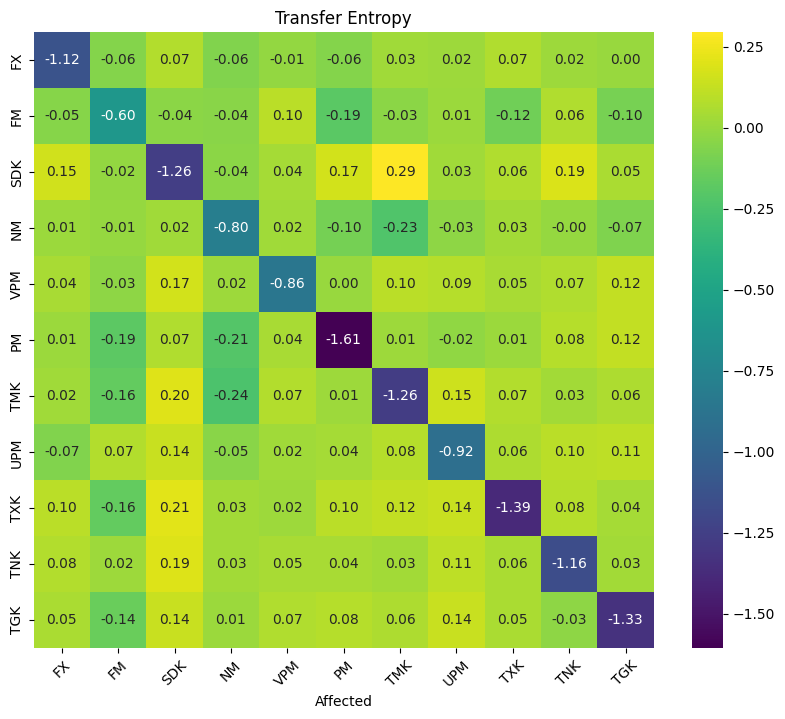

In [ ]:
transfer_entropy_matrix = np.zeros((11, 11))

for i in range(11):
    for j in range(11):
        transfer = transent(scaled_train.iloc[:, i], scaled_train.iloc[:, j], lag=3)
        transfer_entropy_matrix[i, j] = transfer

transfer_entropy_df = pd.DataFrame(transfer_entropy_matrix, 
                                   columns=[f'{scaled_train.columns[i]}' for i in range(11)], 
                                   index=[f'{scaled_train.columns[j]}' for j in range(11)])

plt.figure(figsize=(10, 8))
sns.heatmap(transfer_entropy_df, annot=True, cmap='viridis', fmt=".2f")
plt.title('Transfer Entropy')
plt.xlabel('Affected')
plt.xticks(rotation=45)
plt.show()

In [ ]:
VAR_train = scaled_train.drop(columns=['FM', 'NM', 'SDK', 'TXK'])
VAR_test = scaled_test.drop(columns=['FM', 'NM', 'SDK', 'TXK'])

In [ ]:
result = granger_causality_matrix(VAR_train, 3)
result

,FX_x,VPM_x,PM_x,TMK_x,UPM_x,TNK_x,TGK_x
FX_y,1.0,0.0,0.0,0.0,0.0,0.0,0.0
VPM_y,0.0,1.0,0.0049,0.0,0.0,0.0,0.0
PM_y,0.0,0.0076,1.0,0.0006,0.0001,0.0033,0.0198
TMK_y,0.0,0.0001,0.0,1.0,0.0357,0.0008,0.0
UPM_y,0.0072,0.0,0.0,0.0003,1.0,0.0,0.0
TNK_y,0.0,0.0,0.0,0.0,0.0,1.0,0.0002
TGK_y,0.0,0.0,0.0,0.0,0.0,0.0,1.0


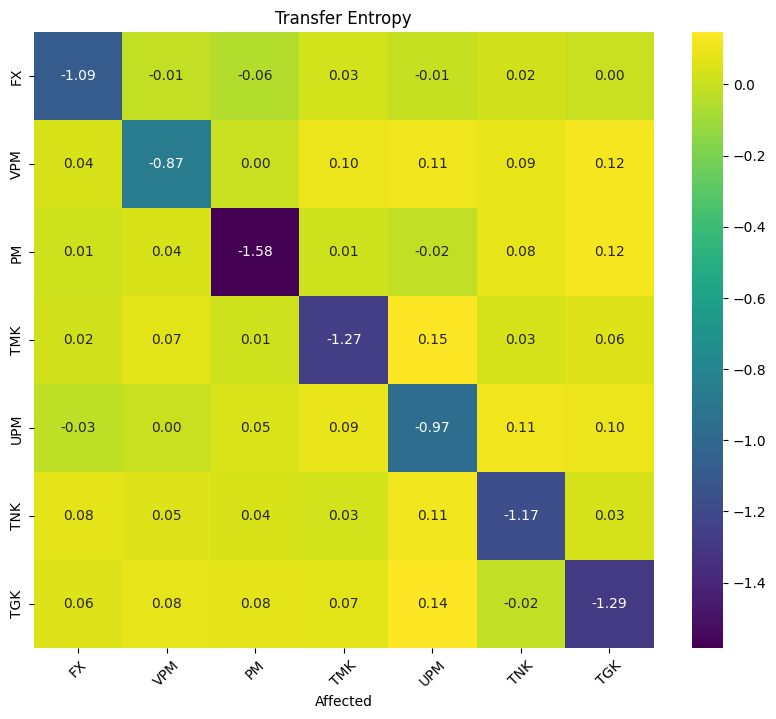

In [ ]:
transfer_entropy_matrix = np.zeros((7, 7))

for i in range(7):
    for j in range(7):
        transfer = transent(VAR_train.iloc[:, i], VAR_train.iloc[:, j], lag=3)
        transfer_entropy_matrix[i, j] = transfer

transfer_entropy_df = pd.DataFrame(transfer_entropy_matrix, 
                                   columns=[f'{VAR_train.columns[i]}' for i in range(7)], 
                                   index=[f'{VAR_train.columns[j]}' for j in range(7)])

plt.figure(figsize=(10, 8))
sns.heatmap(transfer_entropy_df, annot=True, cmap='viridis', fmt=".2f")
plt.title('Transfer Entropy')
plt.xlabel('Affected')
plt.xticks(rotation=45)
plt.show()

### Model training

In [ ]:
start = time.time()
best_model = VARMAX(VAR_train, order=(3,0))
best_model_fit = best_model.fit(disp=False)
end = time.time()
print(best_model_fit.summary())

                                          Statespace Model Results                                         
Dep. Variable:     ['FX', 'VPM', 'PM', 'TMK', 'UPM', 'TNK', 'TGK']   No. Observations:                 1460
Model:                                                      VAR(3)   Log Likelihood                8648.386
                                                       + intercept   AIC                         -16932.772
Date:                                             Thu, 14 Nov 2024   BIC                         -15970.685
Time:                                                     15:04:23   HQIC                        -16573.875
Sample:                                                          0                                         
                                                            - 1460                                         
Covariance Type:                                               opg                                         
Ljung-Box (L1) (Q):     0.01

In [ ]:
print(end-start)

206.35968446731567


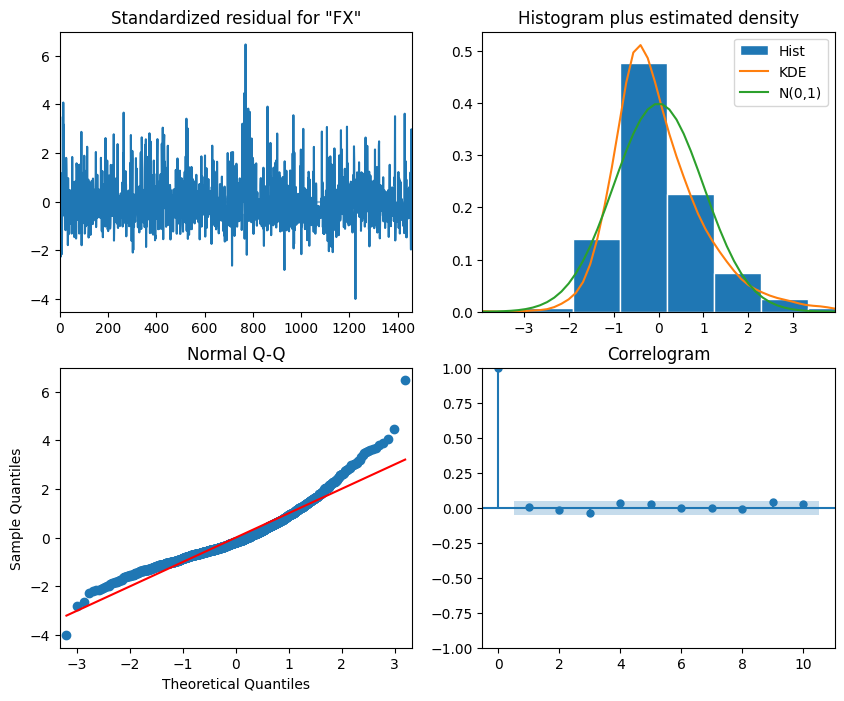

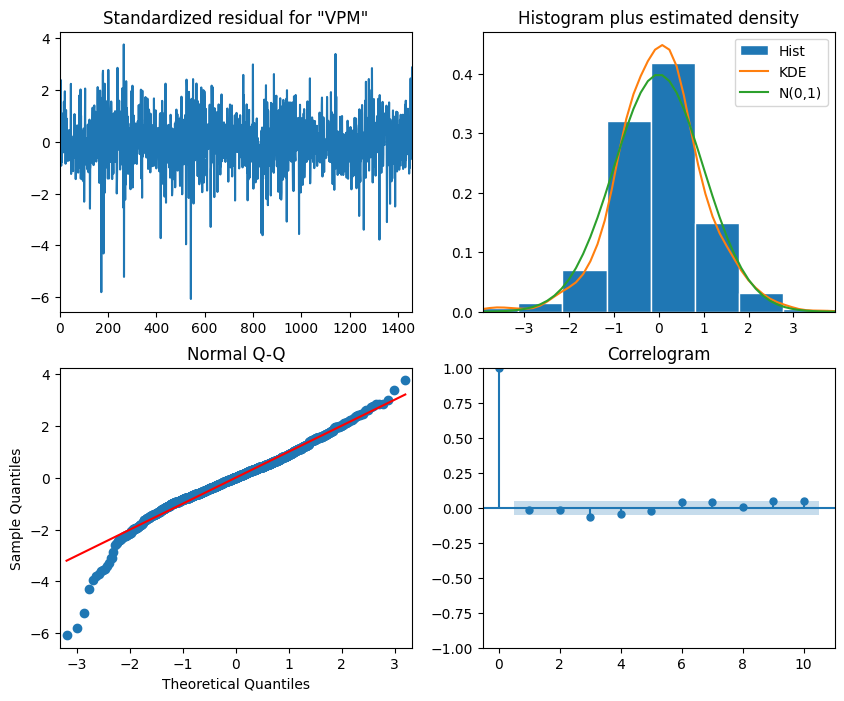

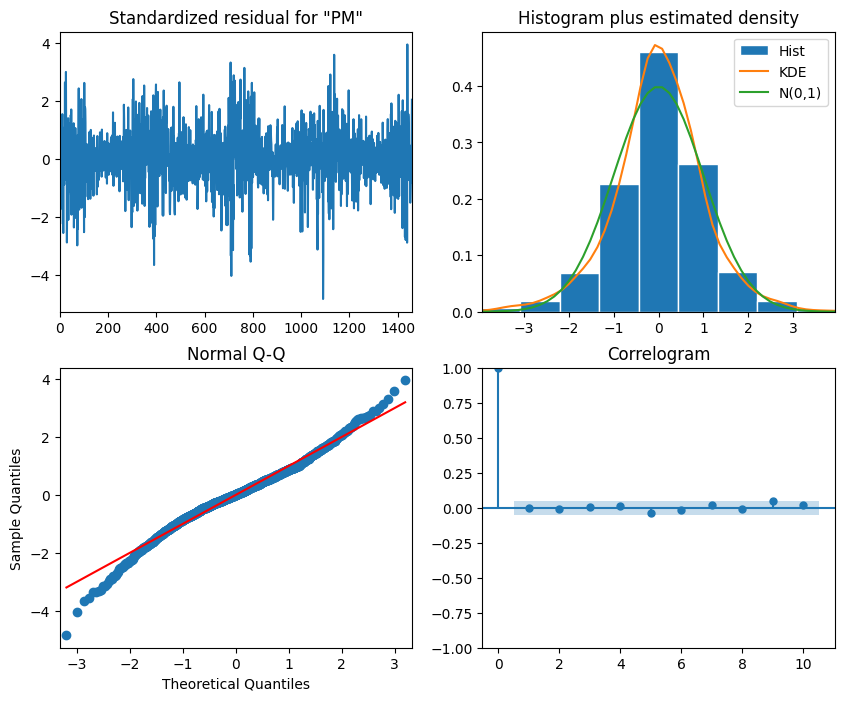

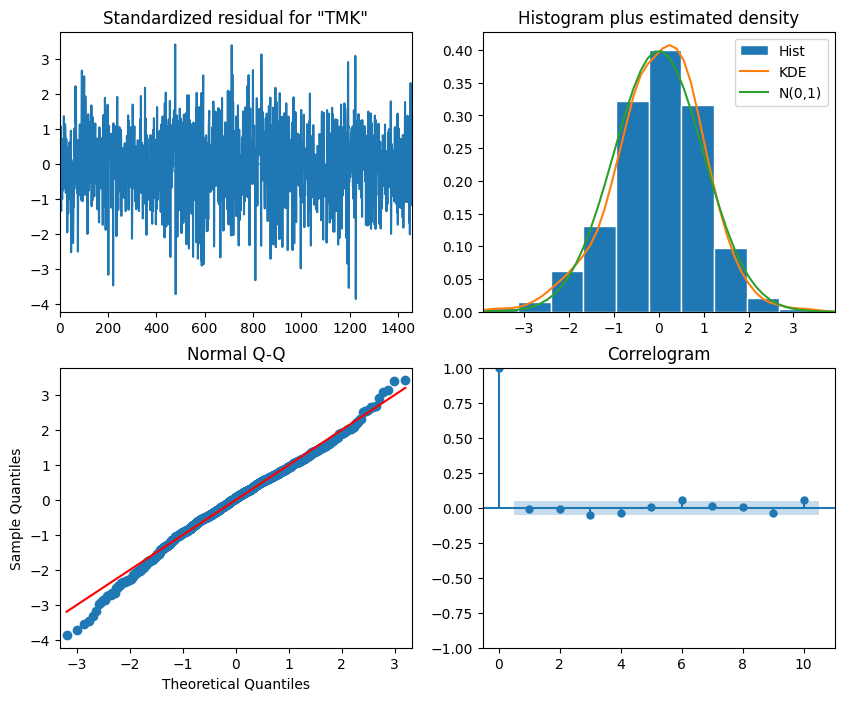

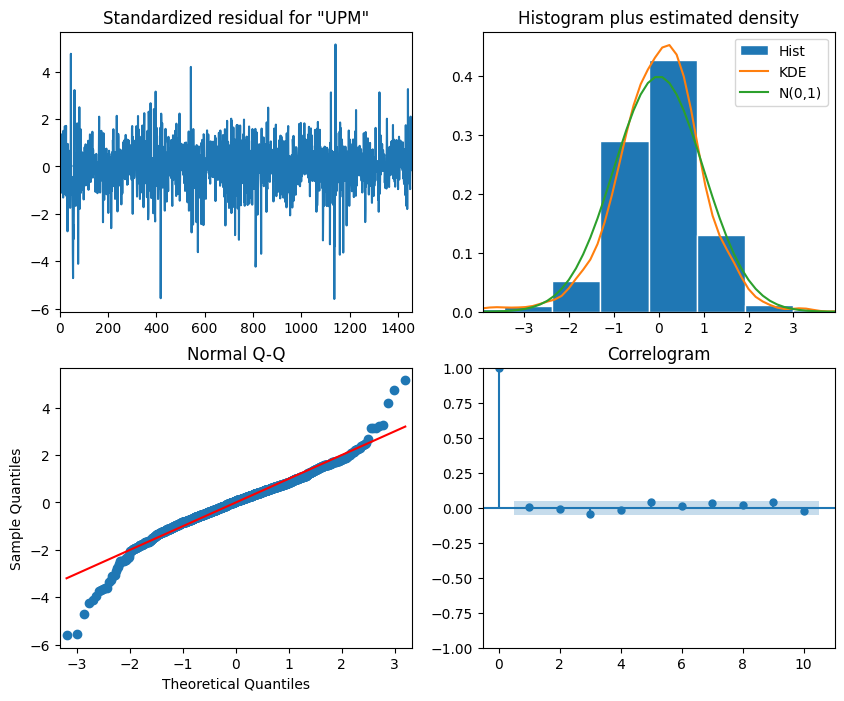

In [ ]:
for i in range(6):
    best_model_fit.plot_diagnostics(figsize=(10, 8), variable=i)

plt.show()

In [ ]:
TRAIN_LEN = len(VAR_train)
HORIZON = len(VAR_test)
WINDOW = HORIZON

In [ ]:
def rolling_forecast(df: pd.DataFrame, train_len: int, horizon: int, window: int) -> pd.DataFrame:
    
    total_len = train_len + horizon
    end_idx = train_len
    
    predictions_dict = {col: [] for col in df.columns}

    for i in range(train_len, total_len, window):
        model = VARMAX(df[:i], order=(3,0))
        res = model.fit(disp=False)
        predictions = res.get_prediction(0, i + window - 1)

        for col in df.columns:
            oos_pred = predictions.predicted_mean.iloc[-window:][col]
            predictions_dict[col].extend(oos_pred)

    predictions_df = pd.DataFrame(predictions_dict)
    return predictions_df


In [ ]:
pred_VAR = rolling_forecast(VAR_train, TRAIN_LEN, HORIZON, WINDOW)
pred_VAR.head()

,FX,VPM,PM,TMK,UPM,TNK,TGK
0,-0.224417,0.086614,0.331770,0.198043,0.484054,0.317681,0.363223
1,-0.306213,-0.014083,0.274058,0.159579,0.375075,0.248591,0.295081
2,-0.364823,-0.053911,0.234387,0.147723,0.306944,0.210768,0.258356
3,-0.387178,-0.069557,0.226475,0.148073,0.253266,0.193773,0.236978
4,-0.399490,-0.079063,0.221884,0.148357,0.216773,0.186286,0.225540


### Model Evaluation
#### Scaled data


In [ ]:
cols = pred_VAR.columns

for col in cols:
    print(f'MSE for {col}: {mean_squared_error(VAR_test.loc[:, col], pred_VAR.loc[:, col])}')
    
print(f'MSE total: {mean_squared_error(VAR_test, pred_VAR)}')

MSE for FX: 0.06282975188876665
MSE for VPM: 0.20820510520075322
MSE for PM: 0.0639115158603558
MSE for TMK: 0.16502674138564488
MSE for UPM: 0.23215109701753595
MSE for TNK: 0.15014726148353513
MSE for TGK: 0.16299951851958222
MSE total: 0.1493244273365963


In [ ]:
for col in cols:
    print(f'RMSE for {col}: {mean_squared_error(VAR_test.loc[:, col], pred_VAR.loc[:, col], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(VAR_test, pred_VAR, squared=False)}')

RMSE for FX: 0.25065863617431305
RMSE for VPM: 0.4562949760853753
RMSE for PM: 0.2528072701888848
RMSE for TMK: 0.40623483526852405
RMSE for UPM: 0.48182060667590376
RMSE for TNK: 0.3874884017406652
RMSE for TGK: 0.4037319884769873
RMSE total: 0.37700524494437904


In [ ]:
for col in cols:
    print(f'MAE for {col}: {mean_absolute_error(VAR_test.loc[:, col], pred_VAR.loc[:, col])}')
    
print(f'MAE total: {mean_absolute_error(VAR_test, pred_VAR)}')

MAE for FX: 0.1897642579124121
MAE for VPM: 0.39272991372262844
MAE for PM: 0.19615922097971092
MAE for TMK: 0.3437512443564203
MAE for UPM: 0.387845958286776
MAE for TNK: 0.3371080072262845
MAE for TGK: 0.35199245230502446
MAE total: 0.3141930078270367


In [ ]:
for col in cols:
    print(f'R2 for {col}: {r2_score(VAR_test.loc[:, col], pred_VAR.loc[:, col])}')
    
print(f'R2 total: {r2_score(VAR_test, pred_VAR)}')

R2 for FX: -0.007909346097904502
R2 for VPM: -0.03434786734404405
R2 for PM: -0.04787915186514358
R2 for TMK: -0.04116674201837611
R2 for UPM: -0.02626282518031342
R2 for TNK: -0.03725794707184571
R2 for TGK: -0.04481605689976176
R2 total: -0.03423427663962702


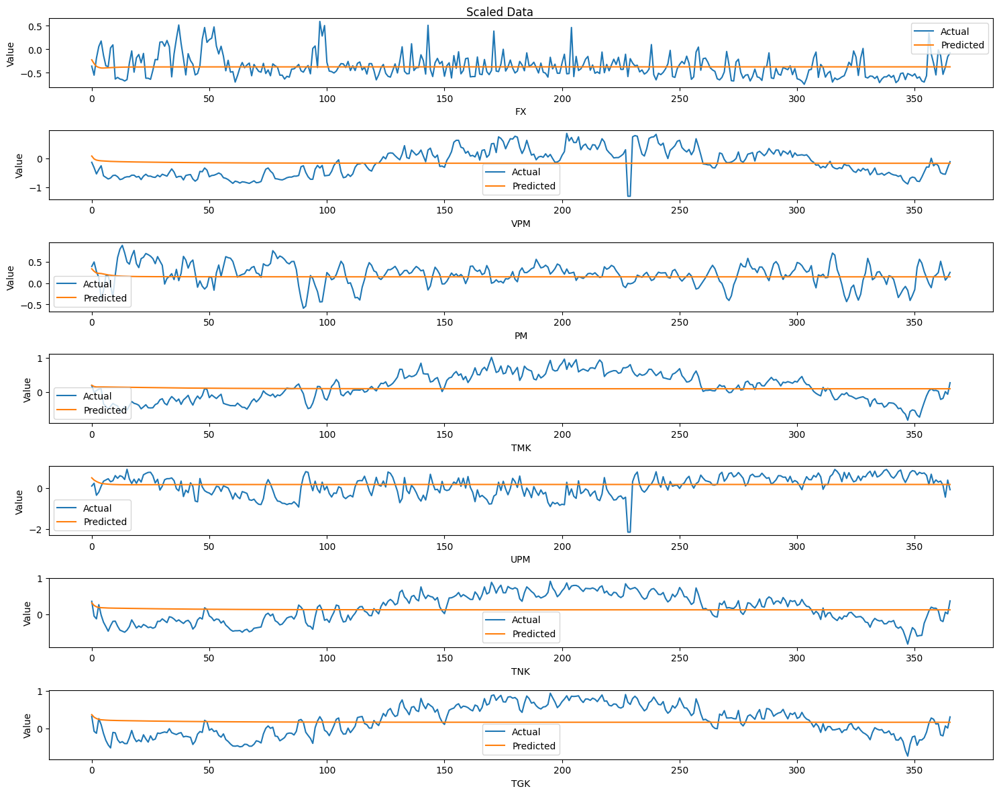

In [ ]:
plt.figure(figsize=(15, 15))
for i, col in enumerate(cols):
    plt.subplot(9, 1, i+1)
    plt.plot(VAR_test.loc[:, col], label='Actual')
    plt.plot(pred_VAR.loc[:, col], label='Predicted')
    plt.title('')
    plt.xlabel(f'{col}')
    plt.ylabel('Value')
    plt.legend()
    
plt.suptitle('Scaled Data')
plt.tight_layout()
plt.show()

#### Unscaled data


In [ ]:
def inverse(dataset, cols):
    temp = dataset.copy()
    for col in cols:
        scaler = scalers['scaler_' + col]
        temp.loc[:, col] = scaler.inverse_transform(np.reshape(dataset.loc[:, col], (-1, 1))).flatten()
    return temp

In [ ]:
inverse_VAR = inverse(pred_VAR, cols)
inverse_VAR.head()

,FX,VPM,PM,TMK,UPM,TNK,TGK
0,12.184919,11.796846,960.588863,12.482625,81.747704,9.527645,8.251913
1,10.794378,10.870436,958.946944,11.747963,78.314850,8.325485,7.069652
2,9.798010,10.504016,957.818307,11.521516,76.168746,7.667356,6.432474
3,9.417968,10.360078,957.593218,11.528188,74.477882,7.371657,6.061566
4,9.208662,10.272618,957.462597,11.533617,73.328361,7.241381,5.863126


In [ ]:
VAR_test_df = test_df.drop(columns=['FM', 'NM', 'SDK', 'TXK'])

for col in cols:
    print(f'MSE for {col}: {mean_squared_error(VAR_test_df.loc[:, col], inverse_VAR.loc[:, col])}')
    
print(f'MSE total: {mean_squared_error(VAR_test_df, inverse_VAR)}')

MSE for FX: 18.157798295853564
MSE for VPM: 17.622480104191744
MSE for PM: 51.73014071616165
MSE for TMK: 60.20340552489713
MSE for UPM: 230.35192601565004
MSE for TNK: 45.458584886755084
MSE for TGK: 49.06652256356094
MSE total: 67.51297972958146


In [ ]:
for col in cols:
    print(f'RMSE for {col}: {mean_squared_error(VAR_test_df.loc[:, col], inverse_VAR.loc[:, col], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(VAR_test_df, inverse_VAR, squared=False)}')

RMSE for FX: 4.261196814963323
RMSE for VPM: 4.197913779985452
RMSE for PM: 7.192366836873774
RMSE for TMK: 7.7590853536288105
RMSE for UPM: 15.177349110290969
RMSE for TNK: 6.742298190287573
RMSE for TGK: 7.00475000007573
RMSE total: 7.476422869443661


In [ ]:
for col in cols:
    print(f'MAE for {col}: {mean_absolute_error(VAR_test_df.loc[:, col], inverse_VAR.loc[:, col])}')
    
print(f'MAE total: {mean_absolute_error(VAR_test_df, inverse_VAR)}')

MAE for FX: 3.225992384511006
MAE for VPM: 3.6131152062481813
MAE for PM: 5.580729836872778
MAE for TMK: 6.565648767207629
MAE for UPM: 12.21714768603344
MAE for TNK: 5.865679325737349
MAE for TGK: 6.107069047492175
MAE total: 6.16791175058608


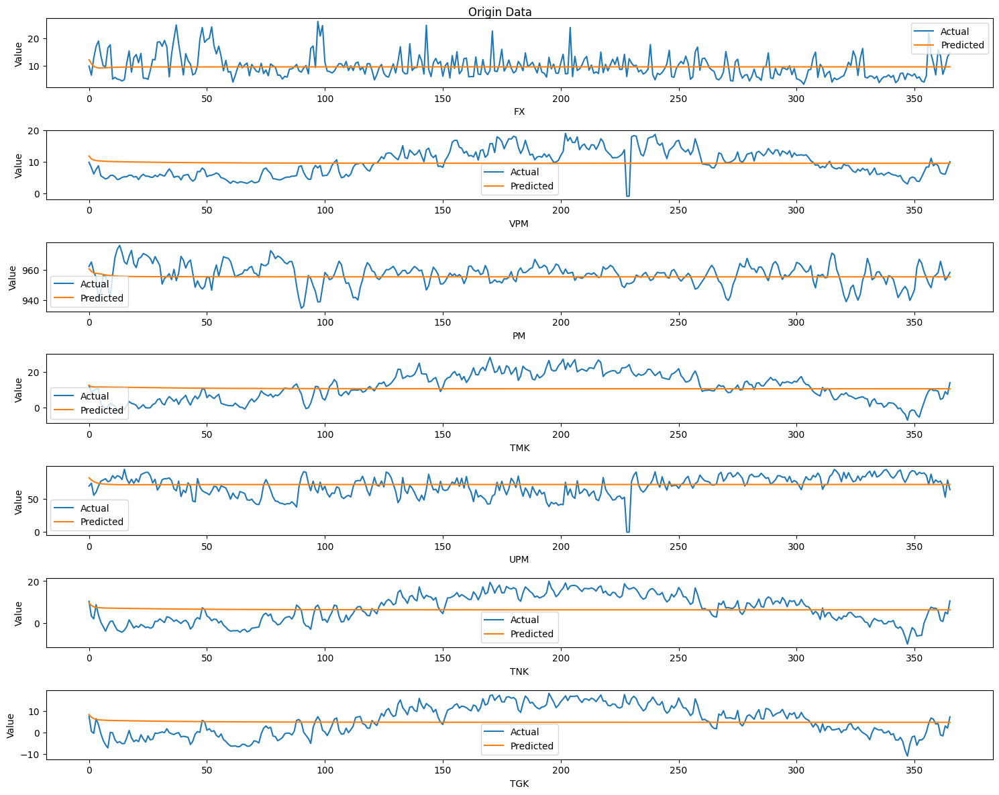

In [ ]:
plt.figure(figsize=(15, 15))
for i, col in enumerate(cols):
    plt.subplot(9, 1, i+1)
    plt.plot(VAR_test_df.iloc[:, i], label='Actual')
    plt.plot(inverse_VAR.iloc[:, i], label='Predicted')
    plt.title('')
    plt.xlabel(f'{col}')
    plt.ylabel('Value')
    plt.legend()

plt.suptitle('Origin Data')
plt.tight_layout()
plt.show()

In [ ]:
def split_series(series, n_past, n_future):
    X, y = list(), list()
    for window_start in range(len(series)):
        past_end = window_start + n_past
        future_end = past_end + n_future
        
        if future_end > len(series):
            break
        
        past, future = series[window_start:past_end, :], series[past_end:future_end, :]
        X.append(past)
        y.append(future)
    return np.array(X), np.array(y)

In [ ]:
n_past = 3
n_future = 1
n_features = 13

In [ ]:
trainX, trainY = split_series(scaled_train.values, n_past, n_future)
trainX = trainX.reshape((trainX.shape[0], trainX.shape[1], n_features))
trainY = trainY[:, 0, :].reshape((trainY.shape[0], n_features))

testX, testY = split_series(scaled_test.values, n_past, n_future)
testX = testX.reshape((testX.shape[0], testX.shape[1], n_features))
testY = testY[:, 0, :].reshape((testY.shape[0], n_features))

# CNN
### Find optimal parameters

In [ ]:
def build_cnn_model(filters, kernel_size, n_past, n_features):
    with strategy.scope():
        inputs = layers.Input(shape=(n_past, n_features), name='input_layer') # (batch_size, n_past, n_features)
        
        # Reshape input to (samples, n_past, n_features, 1) to work with Conv2D
        x = layers.Reshape((n_past, n_features, 1), name='reshape_layer')(inputs)
        
        # Lớp 1: Conv2D với kernel_size (7, n_features) và padding='same'
        conv1 = layers.Conv2D(
            filters=filters,  # Số lượng filter
            kernel_size=(kernel_size, n_features),  # Kích thước kernel (7, n_features)
            activation='relu',
            padding='same', 
            name='conv1_layer')(x) # (batch_size, n_past, n_features, filters)
        
        # Batch Normalization sau lớp Conv1
        conv1 = layers.BatchNormalization(name='conv1_bn')(conv1)
        
        # MaxPooling sau lớp Conv1 với pool_size (2, 2)
        pool1 = layers.MaxPooling2D(pool_size=(2, 2), padding='same', name='pool1')(conv1)
        
        # Lớp 2: Conv2D với kernel_size (3, 3) và padding='same'
        conv2 = layers.Conv2D(
            filters=filters,  # Số lượng filter
            kernel_size=(3, 3),  # Kích thước kernel (3, 3)
            activation='relu',
            padding='same', 
            name='conv2_layer')(pool1)
        
        # Batch Normalization sau lớp Conv2
        conv2 = layers.BatchNormalization(name='conv2_bn')(conv2)
        
        # MaxPooling sau lớp Conv2 với pool_size (2, 2)
        pool2 = layers.MaxPooling2D(pool_size=(2, 2), padding='same', name='pool2')(conv2)
        
        # Flatten để đưa đầu ra vào lớp Dense
        flatten = layers.Flatten(name='flatten')(pool2)
        
        # Output layer: dự đoán cho mỗi đặc trưng (n_features)
        outputs = layers.Dense(n_features, name='output')(flatten)
        
        # Tạo và biên dịch mô hình
        model_CNN = tf.keras.models.Model(inputs, outputs)
        model_CNN.compile(optimizer='adam', loss='mse', metrics=['mae'])
    
    return model_CNN

In [ ]:
print('Starting find optimal parameters for CNN model')

# Tập giá trị tham số cần quét
param_grid = {
    'batch_size': [16, 32, 64],
    'filters': [16, 32, 64],
    'kernel_size': [5, 7, 10]
}

# Lưu kết quả
results = []
grid = ParameterGrid(param_grid)

# Lặp qua từng tổ hợp tham số
for params in grid:
    print(f"Testing with parameters: {params}")
    model = build_cnn_model(params['filters'], params['kernel_size'], n_past, n_features)
    
    # Huấn luyện mô hình
    history = model.fit(
        trainX, trainY,
        batch_size=params['batch_size'],
        epochs=5,
        verbose=0,
        validation_split=0.2
    )
    
    # Lưu kết quả
    loss = history.history['loss'][-1]
    val_loss = history.history['val_loss'][-1]
    results.append({
        'batch_size': params['batch_size'],
        'filters': params['filters'],
        'kernel_size': params['kernel_size'],
        'loss': loss,
        'val_loss': val_loss
    })

# Sắp xếp kết quả theo val_loss
results = sorted(results, key=lambda x: x['val_loss'])

# Hiển thị kết quả tốt nhất
print("Best parameters:", results[0])
best_para_CNN = results[0]

Starting find optimal parameters for CNN model
Testing with parameters: {'batch_size': 16, 'filters': 16, 'kernel_size': 3}


I0000 00:00:1732466287.624388      66 service.cc:145] XLA service 0x7dc1d8008f50 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1732466287.624452      66 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0
I0000 00:00:1732466288.956073      66 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


Testing with parameters: {'batch_size': 16, 'filters': 16, 'kernel_size': 5}
Testing with parameters: {'batch_size': 16, 'filters': 16, 'kernel_size': 7}
Testing with parameters: {'batch_size': 16, 'filters': 32, 'kernel_size': 3}
Testing with parameters: {'batch_size': 16, 'filters': 32, 'kernel_size': 5}
Testing with parameters: {'batch_size': 16, 'filters': 32, 'kernel_size': 7}
Testing with parameters: {'batch_size': 16, 'filters': 64, 'kernel_size': 3}
Testing with parameters: {'batch_size': 16, 'filters': 64, 'kernel_size': 5}
Testing with parameters: {'batch_size': 16, 'filters': 64, 'kernel_size': 7}
Testing with parameters: {'batch_size': 32, 'filters': 16, 'kernel_size': 3}
Testing with parameters: {'batch_size': 32, 'filters': 16, 'kernel_size': 5}
Testing with parameters: {'batch_size': 32, 'filters': 16, 'kernel_size': 7}
Testing with parameters: {'batch_size': 32, 'filters': 32, 'kernel_size': 3}
Testing with parameters: {'batch_size': 32, 'filters': 32, 'kernel_size': 5}

### Model initialization

In [ ]:
class CNN:
    def __init__(self, n_past, n_features, best_para_CNN, strategy):
        self.n_past = n_past
        self.n_features = n_features
        self.best_para_CNN = best_para_CNN
        self.strategy = strategy

        # Xây dựng mô hình CNN
        with self.strategy.scope():
            self.model_CNN = self._build_model()

    def _build_model(filters, kernel_size, n_past, n_features):
        with strategy.scope():
            inputs = layers.Input(shape=(n_past, n_features), name='input_layer') # (batch_size, n_past, n_features)
            
            # Reshape input to (samples, n_past, n_features, 1) to work with Conv2D
            x = layers.Reshape((n_past, n_features, 1), name='reshape_layer')(inputs)
            
            # Lớp 1: Conv2D với kernel_size (7, n_features) và padding='same'
            conv1 = layers.Conv2D(
                filters=filters,  # Số lượng filter
                kernel_size=(kernel_size, n_features),  # Kích thước kernel (7, n_features)
                activation='relu',
                padding='same', 
                name='conv1_layer')(x) # (batch_size, n_past, n_features, filters)
            
            # Batch Normalization sau lớp Conv1
            conv1 = layers.BatchNormalization(name='conv1_bn')(conv1)
            
            # MaxPooling sau lớp Conv1 với pool_size (2, 2)
            pool1 = layers.MaxPooling2D(pool_size=(2, 2), padding='same', name='pool1')(conv1)
            
            # Lớp 2: Conv2D với kernel_size (3, 3) và padding='same'
            conv2 = layers.Conv2D(
                filters=filters,  # Số lượng filter
                kernel_size=(3, 3),  # Kích thước kernel (3, 3)
                activation='relu',
                padding='same', 
                name='conv2_layer')(pool1)
            
            # Batch Normalization sau lớp Conv2
            conv2 = layers.BatchNormalization(name='conv2_bn')(conv2)
            
            # MaxPooling sau lớp Conv2 với pool_size (2, 2)
            pool2 = layers.MaxPooling2D(pool_size=(2, 2), padding='same', name='pool2')(conv2)
            
            # Flatten để đưa đầu ra vào lớp Dense
            flatten = layers.Flatten(name='flatten')(pool2)
            
            # Output layer: dự đoán cho mỗi đặc trưng (n_features)
            outputs = layers.Dense(n_features, name='output')(flatten)
            
            # Tạo và biên dịch mô hình
            model_CNN = tf.keras.models.Model(inputs, outputs)
            model_CNN.compile(optimizer='adam', loss='mse', metrics=['mae'])
        
        return model_CNN

    def train(self, trainX, trainY):
        print('Start training CNN')

        reduce_lr = tf.keras.callbacks.LearningRateScheduler(lambda x: 1e-3 * 0.90 ** x)
        early_stop = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

        start = time.time()
        with self.strategy.scope():
            history_CNN = self.model_CNN.fit(
                trainX,
                trainY,
                validation_split=0.2,
                epochs=100,
                batch_size=self.best_para_CNN['batch_size'],
                verbose=0,
                callbacks=[reduce_lr, early_stop]
            )
        end = time.time()
        
        print('Complete training model')
        print(f'Training time: {end - start:.2f} seconds')
        return history_CNN

    def summary(self):
        self.model_CNN.summary()

    def plot_loss(self, history_CNN):
        loss = history_CNN.history['loss']
        val_loss = history_CNN.history['val_loss']
        epochs = range(1, len(loss) + 1)

        plt.figure(figsize=(10, 6))
        plt.plot(epochs, loss, 'bo-', label='Training loss')
        plt.plot(epochs, val_loss, 'ro-', label='Validation loss')
        plt.title('Training and Validation Loss')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        plt.show()

    def predict(self, testX):
        # Phương thức dự đoán
        return self.model_CNN.predict(testX)

In [ ]:
model_CNN = CNN(n_past, n_features, best_para_CNN, strategy)
model_CNN.summary()

Model: "functional_55"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_27 (InputLayer)     │ (None, 3, 7)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_27 (Conv1D)              │ (None, 3, 64)          │         2,304 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling1d_27     │ (None, 64)             │             0 │
│ (GlobalAveragePooling1D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_27 (Dense)                │ (None, 7)              │           455 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,759 (10.78 KB)

 Trainable params: 2,759 (10.78 KB)

 Non-trainable params: 0 (0.00 B)

### Model training

In [ ]:
history_CNN = model_CNN.train(trainX, trainY)
model_CNN.plot_loss(history_CNN)

Start training CNN
Complete training model
Training time: 42.14 seconds


In [ ]:
pred_CNN = model_CNN.predict(testX)

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


### Model Score
#### Scaled data

In [ ]:
for i in range(n_features):
    print(f'MSE for {scaled_test.columns[i]}: {mean_squared_error(testY[:, i], pred_CNN[:, i])}')
    
print(f'MSE total: {mean_squared_error(testY, pred_CNN)}')

MSE for FX: 0.10923427603514738
MSE for FM: 0.12299409003465711
MSE for RSK: 0.0547975047245355
MSE for RSKF: 0.4700869575769406
MSE for SDK: 0.2385362057825497
MSE for NM: 0.1939568802278331
MSE for VPM: 0.049568796881932845
MSE for PM: 0.051542153948994945
MSE for TMK: 0.023543663684257865
MSE for UPM: 0.05240984388094496
MSE for TXK: 0.026028343267685418
MSE for TNK: 0.018211698406664995
MSE for TGK: 0.026439677947804018
MSE total: 0.11056539172307298


In [ ]:
for i in range(n_features):
    print(f'RMSE for {scaled_test.columns[i]}: {mean_squared_error(testY[:, i], pred_CNN[:, i], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(testY, pred_CNN, squared=False)}')

RMSE for FX: 0.33050609076860804
RMSE for FM: 0.35070513260381164
RMSE for RSK: 0.2340886685094678
RMSE for RSKF: 0.6856288774380354
RMSE for SDK: 0.4884016848686639
RMSE for NM: 0.44040535899082006
RMSE for VPM: 0.22264051042416527
RMSE for PM: 0.2270289716071386
RMSE for TMK: 0.153439446311103
RMSE for UPM: 0.2289319634322498
RMSE for TXK: 0.1613330197686928
RMSE for TNK: 0.13495072584712167
RMSE for TGK: 0.16260282269322393
RMSE total: 0.29389717486639244


In [ ]:
for i in range(n_features):
    print(f'MAE for {scaled_test.columns[i]}: {mean_absolute_error(testY[:, i], pred_CNN[:, i])}')
    
print(f'MAE total: {mean_absolute_error(testY, pred_CNN)}')

MAE for FX: 0.2446660220788573
MAE for FM: 0.30116256275388936
MAE for RSK: 0.15185899716144483
MAE for RSKF: 0.5976790172763128
MAE for SDK: 0.4078306746519437
MAE for NM: 0.34258082634532117
MAE for VPM: 0.16729271030640078
MAE for PM: 0.17341072395585416
MAE for TMK: 0.12179121348785549
MAE for UPM: 0.17472271484562102
MAE for TXK: 0.12800411701706596
MAE for TNK: 0.10478170107232926
MAE for TGK: 0.13140603964907976
MAE total: 0.23439902466169033


In [ ]:
for i in range(n_features):
    print(f'R2 for {scaled_test.columns[i]}: {r2_score(testY[:, i], pred_CNN[:, i])}')
    
print(f'R2 total: {r2_score(testY, pred_CNN)}')

R2 for FX: 0.21215789497721416
R2 for FM: -0.3671736430073129
R2 for RSK: -0.052783853256421986
R2 for RSKF: 0.2508541583950745
R2 for SDK: 0.3669477293165724
R2 for NM: 0.31176520777412453
R2 for VPM: 0.7113089878230949
R2 for PM: 0.5476215149700043
R2 for TMK: 0.8737501667209329
R2 for UPM: 0.46866896636513444
R2 for TXK: 0.8542261135021456
R2 for TNK: 0.9065965812107221
R2 for TGK: 0.88084435887751
R2 total: 0.4588295525899078


#### Unscaled data

In [ ]:
unscaled_CNN = unscale(pred_CNN)
originY = unscale(testY)

In [ ]:
for i in range(n_features):
    print(f'MSE for {scaled_test.columns[i]}: {mean_squared_error(originY[:, i], unscaled_CNN[:, i])}')
    
print(f'MSE total: {mean_squared_error(originY, unscaled_CNN)}')

MSE for FX: 23.28437818040164
MSE for FM: 26.21742015488186
MSE for RSK: 11.680636295387114
MSE for RSKF: 100.20373589086122
MSE for SDK: 50.84637724387426
MSE for NM: 41.34384868027439
MSE for VPM: 10.566084651153298
MSE for PM: 10.98672551183802
MSE for TMK: 5.018567328372284
MSE for UPM: 11.171682043483376
MSE for TXK: 5.548201758906248
MSE for TNK: 3.882005615031678
MSE for TGK: 5.635881879843476
MSE total: 23.568118864177613


In [ ]:
for i in range(n_features):
    print(f'RMSE for {scaled_test.columns[i]}: {mean_squared_error(originY[:, i], unscaled_CNN[:, i], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(originY, unscaled_CNN, squared=False)}')

RMSE for FX: 4.825388914937493
RMSE for FM: 5.120294928505765
RMSE for RSK: 3.4176945877867895
RMSE for RSKF: 10.010181611282645
RMSE for SDK: 7.13066457238554
RMSE for NM: 6.4299182483352295
RMSE for VPM: 3.25055143801068
RMSE for PM: 3.3146229818545008
RMSE for TMK: 2.240215911105955
RMSE for UPM: 3.342406624497291
RMSE for TXK: 2.3554621115412253
RMSE for TNK: 1.9702805929693563
RMSE for TGK: 2.3740012383828857
RMSE total: 4.290898750891952


In [ ]:
for i in range(n_features):
    print(f'MAE for {scaled_test.columns[i]}: {mean_absolute_error(originY[:, i], unscaled_CNN[:, i])}')
    
print(f'MAE total: {mean_absolute_error(originY, unscaled_CNN)}')

MAE for FX: 3.5721239276058276
MAE for FM: 4.396973406869374
MAE for RSK: 2.217141454253834
MAE for RSKF: 8.726113675249671
MAE for SDK: 5.954327845224816
MAE for NM: 5.001680051202859
MAE for VPM: 2.4424735370616113
MAE for PM: 2.5317965658665558
MAE for TMK: 1.7781517217115397
MAE for UPM: 2.550951589704501
MAE for TXK: 1.8688601319026696
MAE for TNK: 1.5298128289657922
MAE for TGK: 1.918528195532831
MAE total: 3.422225763934762


### Plot predict data

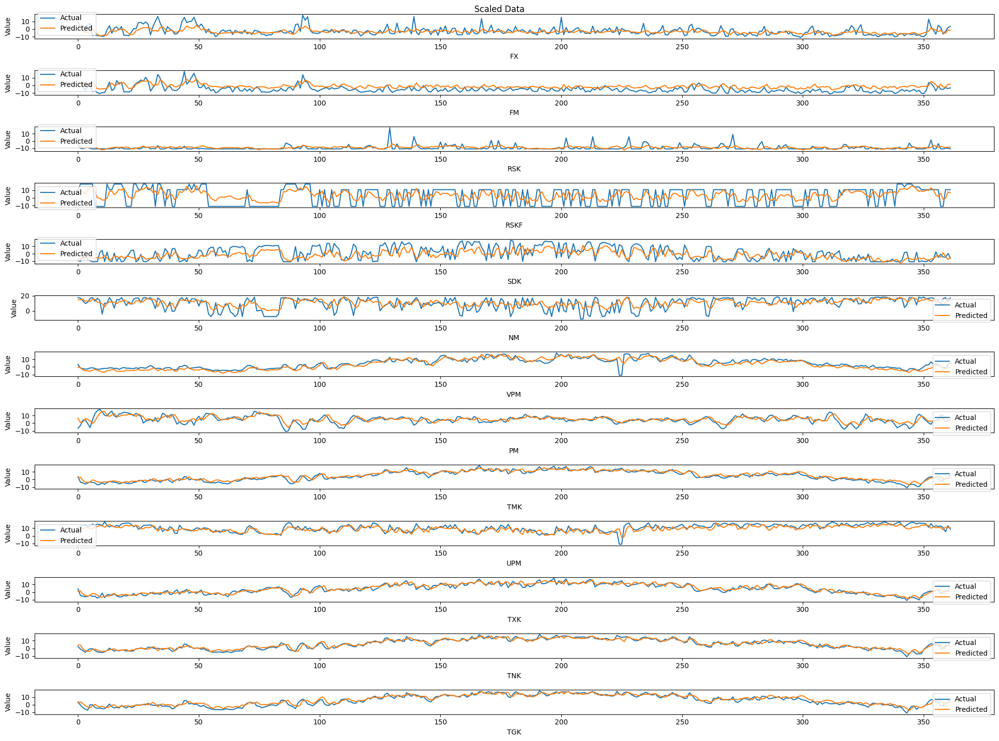

In [ ]:
plt.figure(figsize=(20, 15))
for i in range(n_features):
    plt.subplot(n_features, 1, i+1)
    plt.plot(originY[:, i], label='Actual')
    plt.plot(unscaled_CNN[:, i], label='Predicted')
    plt.title('')
    plt.xlabel(f'{scaled_test.columns[i]}')
    plt.ylabel('Value')
    plt.legend()
    
plt.suptitle('Scaled Data')
plt.tight_layout()
plt.show()

# LSTM
### Find optimal parameters

In [ ]:
def build_lstm_model(n_units, n_past, n_features):
    with strategy.scope():
        inputs = tf.keras.layers.Input(shape=(n_past, n_features), name='input') 
        lstm = tf.keras.layers.LSTM(n_units, return_state=True, name='lstm')
        _, state_h, _ = lstm(inputs)
        
        outputs = tf.keras.layers.Dense(n_features, name='dense')(state_h)
        
        model_LSTM = tf.keras.models.Model(inputs, outputs)
        model_LSTM.compile(optimizer='adam', loss='mse', metrics=['mae'])
        
    return model_LSTM

In [ ]:
print('Starting find optimal parameters for LSTM model')

# Tập giá trị tham số cần quét
param_grid = {
    'batch_size': [16, 32, 64],
    'units': [32, 64, 128]
}

# Lưu tham số và kết quả
results = []
grid = ParameterGrid(param_grid)

# Lặp qua từng tham số
for params in grid:
    print(f"Testing with parameters: {params}")
    model = build_lstm_model(params['units'], n_past, n_features)
    
    # Huấn luyện mô hình
    history = model.fit(
        trainX, trainY,
        batch_size=params['batch_size'],
        epochs=5,
        verbose=0
    )
    
    # Lưu lại kết quả
    loss = history.history['loss'][-1]
    mae = history.history['mae'][-1]
    results.append({
        'batch_size': params['batch_size'],
        'units': params['units'],
        'loss': loss,
        'mae': mae
    })

# Sắp xếp kết quả theo loss
results = sorted(results, key=lambda x: x['loss'])

# Hiển thị kết quả tốt nhất
print("Best parameters:", results[0])
best_para_LSTM = results[0]

Starting find optimal parameters for LSTM model
Testing with parameters: {'batch_size': 16, 'units': 32}
Testing with parameters: {'batch_size': 16, 'units': 64}
Testing with parameters: {'batch_size': 16, 'units': 128}
Testing with parameters: {'batch_size': 32, 'units': 32}
Testing with parameters: {'batch_size': 32, 'units': 64}
Testing with parameters: {'batch_size': 32, 'units': 128}
Testing with parameters: {'batch_size': 64, 'units': 32}
Testing with parameters: {'batch_size': 64, 'units': 64}
Testing with parameters: {'batch_size': 64, 'units': 128}
Best parameters: {'batch_size': 16, 'units': 128, 'loss': 0.09402834624052048, 'mae': 0.2019689530134201}


### Model initialization

In [ ]:
class LSTM_Model:
    def __init__(self, n_past, n_features, best_para_LSTM, strategy):
        self.n_past = n_past
        self.n_features = n_features
        self.best_para_LSTM = best_para_LSTM
        self.strategy = strategy

        # Xây dựng mô hình LSTM
        with self.strategy.scope():
            self.model_LSTM = self._build_model()

    def _build_model(n_units, n_past, n_features):
        with strategy.scope():
            inputs = tf.keras.layers.Input(shape=(n_past, n_features), name='input') 
            lstm = tf.keras.layers.LSTM(n_units, return_state=True, name='lstm')
            _, state_h, _ = lstm(inputs)
            
            outputs = tf.keras.layers.Dense(n_features, name='dense')(state_h)
            
            model_LSTM = tf.keras.models.Model(inputs, outputs)
            model_LSTM.compile(optimizer='adam', loss='mse', metrics=['mae'])
            
        return model_LSTM

    def train(self, trainX, trainY):
        print('Start training LSTM')

        reduce_lr = tf.keras.callbacks.LearningRateScheduler(lambda x: 1e-3 * 0.90 ** x)
        early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
        start = time.time()
        with self.strategy.scope():
            history_LSTM = self.model_LSTM.fit(
                trainX,
                trainY,
                epochs=50,
                validation_split=0.2,
                batch_size=self.best_para_LSTM['batch_size'],
                verbose=0,
                callbacks=[reduce_lr, early_stopping]
            )
        end = time.time()
        print('Complete training model')
        print(f'Training time: {end - start:.2f} seconds')
        return history_LSTM

    def summary(self):
        self.model_LSTM.summary()

    def plot_loss(self, history_LSTM):
        loss = history_LSTM.history['loss']
        val_loss = history_LSTM.history['val_loss']
        epochs = range(1, len(loss) + 1)

        plt.figure(figsize=(10, 6))
        plt.plot(epochs, loss, 'bo-', label='Training loss')
        plt.plot(epochs, val_loss, 'ro-', label='Validation loss')
        plt.title('Training and Validation Loss')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        plt.show()

    def predict(self, testX):
        # Phương thức dự đoán
        return self.model_LSTM.predict(testX)

In [ ]:
lstm_model = LSTM_Model(n_past=n_past, n_features=n_features, best_para_LSTM=best_para_LSTM, strategy=strategy)
lstm_model.summary()

Model: "functional_75"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_37 (InputLayer)     │ (None, 3, 7)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_9 (LSTM)                   │ [(None, 128), (None,   │        69,632 │
│                                 │ 128), (None, 128)]     │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_37 (Dense)                │ (None, 7)              │           903 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 70,535 (275.53 KB)

 Trainable params: 70,535 (275.53 KB)

 Non-trainable params: 0 (0.00 B)

### Model training

In [ ]:
history_LSTM = lstm_model.train(trainX, trainY)
lstm_model.plot_loss(history_LSTM)

Start training LSTM
Complete training model
Training time: 23.63 seconds


In [ ]:
pred_LSTM = lstm_model.predict(testX)

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


### Model Score
#### Scaled data

In [ ]:
for i in range(n_features):
    print(f'MSE for {scaled_test.columns[i]}: {mean_squared_error(testY[:, i], pred_LSTM[:, i])}')
    
print(f'MSE total: {mean_squared_error(testY, pred_LSTM)}')

MSE for FX: 0.10897920315601009
MSE for FM: 0.10089483263189185
MSE for RSK: 0.05195339301416589
MSE for RSKF: 0.4489605193696127
MSE for SDK: 0.22785764370022807
MSE for NM: 0.19039735220490525
MSE for VPM: 0.03693234051109169
MSE for PM: 0.0426071402474114
MSE for TMK: 0.02191629789216545
MSE for UPM: 0.049246951940133676
MSE for TXK: 0.024928828602276007
MSE for TNK: 0.01750238206684718
MSE for TGK: 0.023487347456840706
MSE total: 0.10351263329181383


In [ ]:
for i in range(n_features):
    print(f'RMSE for {scaled_test.columns[i]}: {mean_squared_error(testY[:, i], pred_LSTM[:, i], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(testY, pred_LSTM, squared=False)}')

RMSE for FX: 0.330119982969844
RMSE for FM: 0.3176394695750071
RMSE for RSK: 0.2279328695343563
RMSE for RSKF: 0.6700451621865594
RMSE for SDK: 0.4773443659458317
RMSE for NM: 0.43634545053765056
RMSE for VPM: 0.19217788767465338
RMSE for PM: 0.20641497098663023
RMSE for TMK: 0.148041541103048
RMSE for UPM: 0.22191654273652894
RMSE for TXK: 0.15788865887794476
RMSE for TNK: 0.13229656861327577
RMSE for TGK: 0.15325582356582965
RMSE total: 0.28241686879285843


In [ ]:
for i in range(n_features):
    print(f'MAE for {scaled_test.columns[i]}: {mean_absolute_error(testY[:, i], pred_LSTM[:, i])}')
    
print(f'MAE total: {mean_absolute_error(testY, pred_LSTM)}')

MAE for FX: 0.24215557123897716
MAE for FM: 0.26806869623721125
MAE for RSK: 0.1356637833698692
MAE for RSKF: 0.5690789113081065
MAE for SDK: 0.38875880043670025
MAE for NM: 0.3359126988188932
MAE for VPM: 0.13521029407189367
MAE for PM: 0.15707239945174947
MAE for TMK: 0.11805963455506938
MAE for UPM: 0.17139449393079453
MAE for TXK: 0.12644596304637692
MAE for TNK: 0.10397437591683081
MAE for TGK: 0.12436289527998833
MAE total: 0.22124296289711237


In [ ]:
for i in range(n_features):
    print(f'R2 for {scaled_test.columns[i]}: {r2_score(testY[:, i], pred_LSTM[:, i])}')
    
print(f'R2 total: {r2_score(testY, pred_LSTM)}')

R2 for FX: 0.21399758450808148
R2 for FM: -0.121523447598888
R2 for RSK: 0.0018579575447541519
R2 for RSKF: 0.2845219364004933
R2 for SDK: 0.3952876115230085
R2 for NM: 0.324395803947894
R2 for VPM: 0.7849043060374269
R2 for PM: 0.6260429167229171
R2 for TMK: 0.8824767040471136
R2 for UPM: 0.5007343670559701
R2 for TXK: 0.8603840362093165
R2 for TNK: 0.9102344940326166
R2 for TGK: 0.8941496205055333
R2 total: 0.5044202993027881


#### Unscaled data

In [ ]:
unscaled_LSTM = unscale(pred_LSTM)
originY = unscale(testY)

In [ ]:
for i in range(n_features):
    print(f'MSE for {scaled_test.columns[i]}: {mean_squared_error(originY[:, i], unscaled_LSTM[:, i])}')
    
print(f'MSE total: {mean_squared_error(originY, unscaled_LSTM)}')

MSE for FX: 23.230006691650054
MSE for FM: 21.506742670478374
MSE for RSK: 11.074385306221743
MSE for RSKF: 95.7004244471257
MSE for SDK: 48.570135008534145
MSE for NM: 40.58509961240779
MSE for VPM: 7.872497577906
MSE for PM: 9.082137973023915
MSE for TMK: 4.671678071597987
MSE for UPM: 10.497480212940454
MSE for TXK: 5.31382917979394
MSE for TNK: 3.7308076714521285
MSE for TGK: 5.006563105978777
MSE total: 22.06475288685468


In [ ]:
for i in range(n_features):
    print(f'RMSE for {scaled_test.columns[i]}: {mean_squared_error(originY[:, i], unscaled_LSTM[:, i], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(originY, unscaled_LSTM, squared=False)}')

RMSE for FX: 4.819751725104734
RMSE for FM: 4.637536271607843
RMSE for RSK: 3.3278199029126774
RMSE for RSKF: 9.782659374992349
RMSE for SDK: 6.969227719664077
RMSE for NM: 6.370643579137652
RMSE for VPM: 2.8057971376965227
RMSE for PM: 3.0136585694175633
RMSE for TMK: 2.161406503089594
RMSE for UPM: 3.2399815142899278
RMSE for TXK: 2.305174435871164
RMSE for TNK: 1.9315298784777128
RMSE for TGK: 2.2375350513408225
RMSE total: 4.123286281815587


In [ ]:
for i in range(n_features):
    print(f'MAE for {scaled_test.columns[i]}: {mean_absolute_error(originY[:, i], unscaled_LSTM[:, i])}')
    
print(f'MAE total: {mean_absolute_error(originY, unscaled_LSTM)}')

MAE for FX: 3.5354713324635423
MAE for FM: 3.913802979619186
MAE for RSK: 1.9806913113930547
MAE for RSKF: 8.308552139710883
MAE for SDK: 5.675878466372456
MAE for NM: 4.904325431499235
MAE for VPM: 1.9740702567053705
MAE for PM: 2.293257028211594
MAE for TMK: 1.7236706693955142
MAE for UPM: 2.5023596030221054
MAE for TXK: 1.8461110826147946
MAE for TNK: 1.518025838651046
MAE for TGK: 1.8156983013316288
MAE total: 3.2301472646915723


### Plot predict data

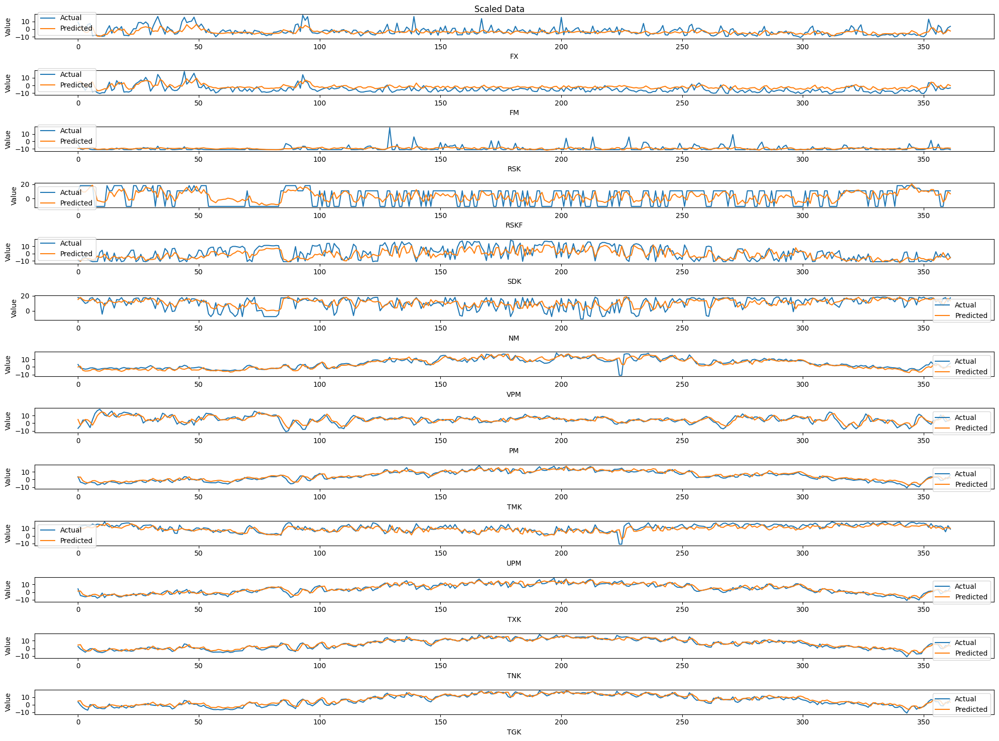

In [ ]:
plt.figure(figsize=(20, 15))
for i in range(n_features):
    plt.subplot(n_features, 1, i+1)
    plt.plot(originY[:, i], label='Actual')
    plt.plot(unscaled_LSTM[:, i], label='Predicted')
    plt.title('')
    plt.xlabel(f'{scaled_test.columns[i]}')
    plt.ylabel('Value')
    plt.legend()
    
plt.suptitle('Scaled Data')
plt.tight_layout()
plt.show()

# CNN + LSTM
### Find optimal parameters

In [ ]:
def build_cnn_lstm_model(filters, kernel_size, lstm_units, n_past, n_features):
    with strategy.scope():
        inputs = layers.Input(shape=(n_past, n_features), name='input_layer')
        x = layers.Reshape((n_past, n_features, 1), name='reshape_layer')(inputs)
    
        conv1 = layers.Conv2D(
            filters=filters,
            kernel_size=(kernel_size, n_features),
            activation='relu',
            padding='same',
            name='conv1')(x)
        conv1_bn = layers.BatchNormalization(name='conv1_bn')(conv1)
        pool1 = layers.MaxPooling2D(pool_size=(2, 2), padding='same', name='pool1')(conv1_bn)
    
        conv2 = layers.Conv2D(
            filters=filters,
            kernel_size=(3, 3),
            activation='relu',
            padding='same',
            name='conv2')(pool1)
        conv2_bn = layers.BatchNormalization(name='conv2_bn')(conv2)
        pool2 = layers.MaxPooling2D(pool_size=(2, 2), padding='same', name='pool2')(conv2_bn)
    
        flatten = layers.Flatten(name='flatten')(pool2)
    
        lstm_input = layers.Reshape((1, flatten.shape[-1]), name='lstm_input')(flatten)
    
        lstm = layers.LSTM(lstm_units, return_state=True, name='lstm')
        _, state_h, _ = lstm(lstm_input)
        
        outputs = layers.Dense(n_features, name='outputs')(state_h)
        
        model_CNN_LSTM = tf.keras.models.Model(inputs, outputs)
        model_CNN_LSTM.compile(optimizer='adam', loss='mse', metrics=['mae'])
        
    return model_CNN_LSTM

In [ ]:
print('Starting find optimal parameters for CNN + LSTM model')
# Tập giá trị tham số cần quét
param_grid = {
    'filters': [16, 32, 64],
    'kernel_size': [5, 7, 10],
    'lstm_units': [32, 64, 128],
    'batch_size': [16, 32, 64]
}

# Lưu kết quả
results = []
grid = ParameterGrid(param_grid)

# Lặp qua từng tổ hợp tham số
for params in grid:
    print(f"Testing with parameters: {params}")
    cnn_lstm_model = build_cnn_lstm_model(params['filters'], params['kernel_size'], 
                                 params['lstm_units'], n_past, n_features)
    with strategy.scope():
        # Huấn luyện mô hình
        history = cnn_lstm_model.fit(
            trainX, trainY,
            batch_size=params['batch_size'],
            epochs=5,
            verbose=0,
            validation_split=0.2
        )
    
    # Lưu kết quả
    loss = history.history['loss'][-1]
    val_loss = history.history['val_loss'][-1]
    results.append({
        'filters': params['filters'],
        'kernel_size': params['kernel_size'],
        'lstm_units': params['lstm_units'],
        'batch_size': params['batch_size'],
        'loss': loss,
        'val_loss': val_loss
    })

# Sắp xếp kết quả theo val_loss
results = sorted(results, key=lambda x: x['val_loss'])

# Hiển thị kết quả tốt nhất
print("Best parameters:", results[0])
best_para_cnn_lstm = results[0]

Starting find optimal parameters for CNN + LSTM model
Testing with parameters: {'batch_size': 16, 'filters': 16, 'kernel_size': 3, 'lstm_units': 32}
Testing with parameters: {'batch_size': 16, 'filters': 16, 'kernel_size': 3, 'lstm_units': 64}
Testing with parameters: {'batch_size': 16, 'filters': 16, 'kernel_size': 3, 'lstm_units': 128}
Testing with parameters: {'batch_size': 16, 'filters': 16, 'kernel_size': 5, 'lstm_units': 32}
Testing with parameters: {'batch_size': 16, 'filters': 16, 'kernel_size': 5, 'lstm_units': 64}
Testing with parameters: {'batch_size': 16, 'filters': 16, 'kernel_size': 5, 'lstm_units': 128}
Testing with parameters: {'batch_size': 16, 'filters': 32, 'kernel_size': 3, 'lstm_units': 32}
Testing with parameters: {'batch_size': 16, 'filters': 32, 'kernel_size': 3, 'lstm_units': 64}
Testing with parameters: {'batch_size': 16, 'filters': 32, 'kernel_size': 3, 'lstm_units': 128}
Testing with parameters: {'batch_size': 16, 'filters': 32, 'kernel_size': 5, 'lstm_units

### Model initialization

In [ ]:
class CNN_LSTM_Model:
    def __init__(self, n_past, n_features, best_para_cnn_lstm, strategy):
        self.n_past = n_past
        self.n_features = n_features
        self.best_para_cnn_lstm = best_para_cnn_lstm
        self.strategy = strategy

        # Xây dựng mô hình CNN + LSTM
        with self.strategy.scope():
            self.model_CNN_LSTM = self._build_model()

    def _build_model(filters, kernel_size, lstm_units, n_past, n_features):
        with strategy.scope():
            inputs = layers.Input(shape=(n_past, n_features), name='input_layer')
            x = layers.Reshape((n_past, n_features, 1), name='reshape_layer')(inputs)
        
            conv1 = layers.Conv2D(
                filters=filters,
                kernel_size=(kernel_size, n_features),
                activation='relu',
                padding='same',
                name='conv1')(x)
            conv1_bn = layers.BatchNormalization(name='conv1_bn')(conv1)
            pool1 = layers.MaxPooling2D(pool_size=(2, 2), padding='same', name='pool1')(conv1_bn)
        
            conv2 = layers.Conv2D(
                filters=filters,
                kernel_size=(3, 3),
                activation='relu',
                padding='same',
                name='conv2')(pool1)
            conv2_bn = layers.BatchNormalization(name='conv2_bn')(conv2)
            pool2 = layers.MaxPooling2D(pool_size=(2, 2), padding='same', name='pool2')(conv2_bn)
        
            flatten = layers.Flatten(name='flatten')(pool2)
        
            lstm_input = layers.Reshape((1, flatten.shape[-1]), name='lstm_input')(flatten)
        
            lstm = layers.LSTM(lstm_units, return_state=True, name='lstm')
            _, state_h, _ = lstm(lstm_input)
            
            outputs = layers.Dense(n_features, name='outputs')(state_h)
            
            model_CNN_LSTM = tf.keras.models.Model(inputs, outputs)
            model_CNN_LSTM.compile(optimizer='adam', loss='mse', metrics=['mae'])
            
        return model_CNN_LSTM

    def train(self, trainX, trainY):
        print('Start training CNN + LSTM')

        reduce_lr = tf.keras.callbacks.LearningRateScheduler(lambda x: 1e-3 * 0.90 ** x)
        early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)

        start = time.time()
        with self.strategy.scope():        
            history_CNN_LSTM = self.model_CNN_LSTM.fit(
                trainX,
                trainY,
                epochs=100,
                validation_split=0.2,
                batch_size=self.best_para_cnn_lstm['batch_size'],
                verbose=0,
                callbacks=[reduce_lr, early_stopping]
            )
        end = time.time()
        print('Complete training model')
        print(f'Training time: {end - start:.2f} seconds')
        return history_CNN_LSTM

    def summary(self):
        self.model_CNN_LSTM.summary()

    def plot_loss(self, history_CNN_LSTM):
        loss = history_CNN_LSTM.history['loss']
        val_loss = history_CNN_LSTM.history['val_loss']
        epochs = range(1, len(loss) + 1)

        plt.figure(figsize=(10, 6))
        plt.plot(epochs, loss, 'bo-', label='Training loss')
        plt.plot(epochs, val_loss, 'ro-', label='Validation loss')
        plt.title('Training and Validation Loss')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.legend()
        plt.show()

    def predict(self, testX):
        # Phương thức dự đoán
        return self.model_CNN_LSTM.predict(testX)

In [ ]:
cnn_lstm_model = CNN_LSTM_Model(n_past=n_past, n_features=n_features, best_para_cnn_lstm=best_para_cnn_lstm, strategy=strategy)
cnn_lstm_model.summary()

Model: "functional_185"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_92 (InputLayer)     │ (None, 3, 7)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv1d_82 (Conv1D)              │ (None, 3, 64)          │         1,408 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_64 (LSTM)                  │ [(None, 128), (None,   │        98,816 │
│                                 │ 128), (None, 128)]     │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_92 (Dense)                │ (None, 7)              │           903 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 101,127 (395.03 KB)

 Trainable params: 101,127 (395.03 KB)

 Non-trainable params: 0 (0.00 B)

### Model training

In [ ]:
history_CNN_LSTM = cnn_lstm_model.train(trainX, trainY)
cnn_lstm_model.plot_loss(history_CNN_LSTM)

Start training CNN + LSTM
Complete training model
Training time: 19.62 seconds


In [ ]:
pred_CNN_LSTM = cnn_lstm_model.predict(testX)

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 14ms/step


### Model Evaluation
#### Scaled data

In [ ]:
for i in range(n_features):
    print(f'MSE for {scaled_test.columns[i]}: {mean_squared_error(testY[:, i], pred_CNN_LSTM[:, i])}')
    
print(f'MSE total: {mean_squared_error(testY, pred_CNN_LSTM)}')

MSE for FX: 0.1076552292028228
MSE for FM: 0.12227136863289674
MSE for RSK: 0.05212492549998422
MSE for RSKF: 0.4800302954141497
MSE for SDK: 0.2506889926700722
MSE for NM: 0.201444150145011
MSE for VPM: 0.0444848826494374
MSE for PM: 0.05382716051165313
MSE for TMK: 0.022442623010691696
MSE for UPM: 0.05132418891009014
MSE for TXK: 0.028426236896347712
MSE for TNK: 0.019824767508181757
MSE for TGK: 0.029507336583047973
MSE total: 0.11261939674110664


In [ ]:
for i in range(n_features):
    print(f'RMSE for {scaled_test.columns[i]}: {mean_squared_error(testY[:, i], pred_CNN_LSTM[:, i], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(testY, pred_CNN_LSTM, squared=False)}')

RMSE for FX: 0.32810856313547015
RMSE for FM: 0.34967323122151733
RMSE for RSK: 0.22830883798045187
RMSE for RSKF: 0.6928421865144686
RMSE for SDK: 0.5006885186121929
RMSE for NM: 0.44882530025056633
RMSE for VPM: 0.21091439649639235
RMSE for PM: 0.23200681134754025
RMSE for TMK: 0.14980862128292782
RMSE for UPM: 0.22654842508852305
RMSE for TXK: 0.1686008211615463
RMSE for TNK: 0.14080045279821282
RMSE for TGK: 0.17177699666441945
RMSE total: 0.296069474042633


In [ ]:
for i in range(n_features):
    print(f'MAE for {scaled_test.columns[i]}: {mean_absolute_error(testY[:, i], pred_CNN_LSTM[:, i])}')
    
print(f'MAE total: {mean_absolute_error(testY, pred_CNN_LSTM)}')

MAE for FX: 0.24556483168662635
MAE for FM: 0.301079041055775
MAE for RSK: 0.1361254595421704
MAE for RSKF: 0.5802748506291877
MAE for SDK: 0.40887586475328247
MAE for NM: 0.335630114533309
MAE for VPM: 0.15657096831529346
MAE for PM: 0.17315435437835303
MAE for TMK: 0.11837380325103254
MAE for UPM: 0.17595100259467117
MAE for TXK: 0.1345592789481741
MAE for TNK: 0.11369936594587451
MAE for TGK: 0.1397752299467674
MAE total: 0.23227955119850122


In [ ]:
for i in range(n_features):
    print(f'R2 for {scaled_test.columns[i]}: {r2_score(testY[:, i], pred_CNN_LSTM[:, i])}')
    
print(f'R2 total: {r2_score(testY, pred_CNN_LSTM)}')

R2 for FX: 0.22354662409652337
R2 for FM: -0.3591400403240812
R2 for RSK: -0.0014375689994976515
R2 for RSKF: 0.23500813230914774
R2 for SDK: 0.3346953955082147
R2 for NM: 0.28519744874575204
R2 for VPM: 0.740917944221523
R2 for PM: 0.5275663227069525
R2 for TMK: 0.8796543540783213
R2 for UPM: 0.47967533721305156
R2 for TXK: 0.8407965121608831
R2 for TNK: 0.8983235379469552
R2 for TGK: 0.8670193481436785
R2 total: 0.4578325652159564


#### Unscaled data

In [ ]:
unscaled_CNN_LSTM = unscale(pred_CNN_LSTM)
originY = unscale(testY)

In [ ]:
for i in range(n_features):
    print(f'MSE for {scaled_test.columns[i]}: {mean_squared_error(originY[:, i], pred_CNN_LSTM[:, i])}')
    
print(f'MSE total: {mean_squared_error(originY, pred_CNN_LSTM)}')

MSE for FX: 33.583456776370724
MSE for FM: 39.34243110314703
MSE for RSK: 84.13209563880514
MSE for RSKF: 137.07496800602843
MSE for SDK: 76.96358394637824
MSE for NM: 144.1161551057584
MSE for VPM: 52.788251813042365
MSE for PM: 43.86969917934373
MSE for TMK: 52.78476512629914
MSE for UPM: 121.70218860739134
MSE for TXK: 49.354795126378335
MSE for TNK: 65.58781422340014
MSE for TGK: 71.2210781263286
MSE total: 74.80932944451317


In [ ]:
for i in range(n_features):
    print(f'RMSE for {scaled_test.columns[i]}: {mean_squared_error(originY[:, i], pred_CNN_LSTM[:, i], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(originY, pred_CNN_LSTM, squared=False)}')

RMSE for FX: 5.795123534176879
RMSE for FM: 6.272354510321226
RMSE for RSK: 9.172354966899457
RMSE for RSKF: 11.707901947233262
RMSE for SDK: 8.772889144767431
RMSE for NM: 12.00483882048228
RMSE for VPM: 7.265552409352118
RMSE for PM: 6.62342050449341
RMSE for TMK: 7.265312458958606
RMSE for UPM: 11.031871491609722
RMSE for TXK: 7.025296799878161
RMSE for TNK: 8.09863039182553
RMSE for TGK: 8.439258150236228
RMSE total: 8.42113885617187


In [ ]:
for i in range(n_features):
    print(f'MAE for {scaled_test.columns[i]}: {mean_absolute_error(originY[:, i], pred_CNN_LSTM[:, i])}')
    
print(f'MAE total: {mean_absolute_error(originY, pred_CNN_LSTM)}')

MAE for FX: 4.854194748918839
MAE for FM: 5.630694673797963
MAE for RSK: 8.881982247306762
MAE for RSKF: 11.504110209723082
MAE for SDK: 7.726833550512472
MAE for NM: 10.84939206942525
MAE for VPM: 5.762827646600733
MAE for PM: 5.659118184566693
MAE for TMK: 5.960701942247701
MAE for UPM: 10.232272319544744
MAE for TXK: 5.806667620107798
MAE for TNK: 6.56035910904304
MAE for TGK: 6.823594616816601
MAE total: 7.40405761066244


### Plot predict data

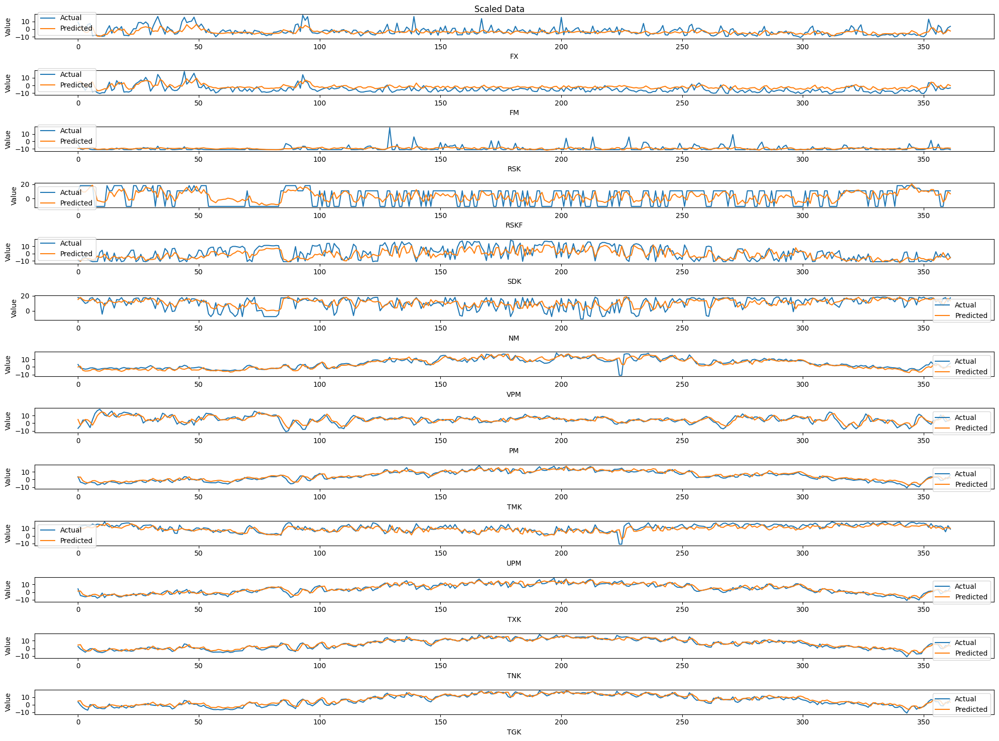

In [ ]:
plt.figure(figsize=(20, 15))
for i in range(n_features):
    plt.subplot(n_features, 1, i+1)
    plt.plot(originY[:, i], label='Actual')
    plt.plot(unscaled_CNN_LSTM[:, i], label='Predicted')
    plt.title('')
    plt.xlabel(f'{scaled_test.columns[i]}')
    plt.ylabel('Value')
    plt.legend()
    
plt.suptitle('Scaled Data')
plt.tight_layout()
plt.show()

## VAR-NN
### Defining model

In [91]:
def to_sequences_multivariate(dataset, p):
    x = []
    y = []
    for i in range(p, len(dataset)):
        x.append(dataset.iloc[i - p:i, 0:dataset.shape[1]])
        y.append(dataset.iloc[i:i + 1, 0:dataset.shape[1]])
    x = np.array(x)
    y = np.array(y)
    return x,y.reshape(y.shape[0], y.shape[2])

In [ ]:
p = 3

trainX, trainY = to_sequences_multivariate(VAR_train, p)
testX, testY = to_sequences_multivariate(VAR_test, p)

In [93]:
class VARNN(tf.keras.Model):
    def __init__(self, ffnn_model, var_model):
        super(VARNN, self).__init__()
        self.ffnn_model = ffnn_model
        self.var_model = var_model

    def call(self, inputs):
        ffnn_output = self.ffnn_model(inputs)
        var_output = self.var_model(ffnn_output)
        return var_output

In [ ]:
num_outputs = 7
ffnn_model = tf.keras.models.Sequential([
    tf.keras.layers.Flatten(input_shape=(p, 7)),
    tf.keras.layers.Dense(50, activation='sigmoid'),
])
var_model = tf.keras.layers.Dense(num_outputs)

In [95]:
VARNN_model = VARNN(ffnn_model, var_model)
start = time.time()
VARNN_model.compile(optimizer='adam', loss='mse')
history = VARNN_model.fit(trainX, trainY, verbose=0, epochs=100, batch_size=32, validation_split=0.2)
end = time.time()

In [ ]:
print(end-start)

10.99874472618103


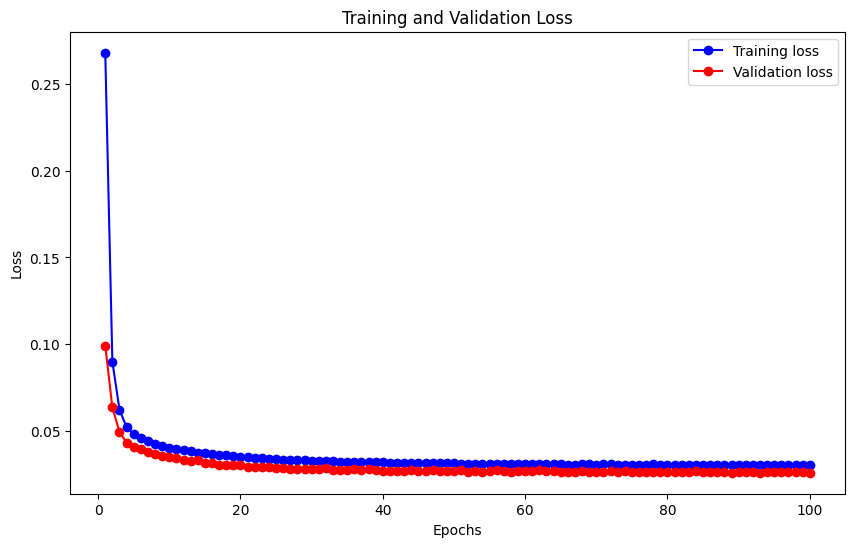

In [ ]:
loss = history.history['loss']
val_loss = history.history['val_loss']

epochs = range(1, len(loss) + 1)

plt.figure(figsize=(10, 6))
plt.plot(epochs, loss, 'bo-', label='Training loss')
plt.plot(epochs, val_loss, 'ro-', label='Validation loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [ ]:
pred_VARNN = VARNN_model.predict(testX)

12/12 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step 


### Model Evaluation
#### Scaled data

In [ ]:
for i in range(num_outputs):
    print(f'MSE for {scaled_test.columns[i]}: {mean_squared_error(testY[:, i], pred_VARNN[:, i])}')
    
print(f'MSE total: {mean_squared_error(testY, pred_VARNN)}')

MSE for FX: 0.0486163049373575
MSE for FM: 0.032079493888327745
MSE for SDK: 0.01938932412654942
MSE for NM: 0.013810252975924267
MSE for VPM: 0.09397084881575692
MSE for PM: 0.011890407824432103
MSE for TMK: 0.01324818423266218
MSE total: 0.033286402400144306


In [ ]:
for i in range(num_outputs):
    print(f'RMSE for {scaled_test.columns[i]}: {mean_squared_error(testY[:, i], pred_VARNN[:, i], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(testY, pred_VARNN, squared=False)}')

RMSE for FX: 0.2204910540982502
RMSE for FM: 0.1791074925521759
RMSE for SDK: 0.13924555334569724
RMSE for NM: 0.1175170327055796
RMSE for VPM: 0.30654665030914446
RMSE for PM: 0.10904314661835517
RMSE for TMK: 0.115100756872673
RMSE total: 0.16957881235741082


In [ ]:
for i in range(num_outputs):
    print(f'MAE for {scaled_test.columns[i]}: {mean_absolute_error(testY[:, i], pred_VARNN[:, i])}')
    
print(f'MAE total: {mean_absolute_error(testY, pred_VARNN)}')

MAE for FX: 0.16716470261400357
MAE for FM: 0.11647832891600962
MAE for SDK: 0.1056366547510812
MAE for NM: 0.09145258146467398
MAE for VPM: 0.23541586992581665
MAE for PM: 0.08291904837460941
MAE for TMK: 0.08968984317022802
MAE total: 0.12696528988806038


In [ ]:
for i in range(num_outputs):
    print(f'R2 for {scaled_test.columns[i]}: {r2_score(testY[:, i], pred_VARNN[:, i])}')
    
print(f'R2 total: {r2_score(testY, pred_VARNN)}')

R2 for FX: 0.22422803651240553
R2 for FM: 0.8415497414958727
R2 for SDK: 0.6829575858693759
R2 for NM: 0.9135325583804739
R2 for VPM: 0.586888901384744
R2 for PM: 0.9182777883828884
R2 for TMK: 0.915454647490246
R2 total: 0.7261270370737153


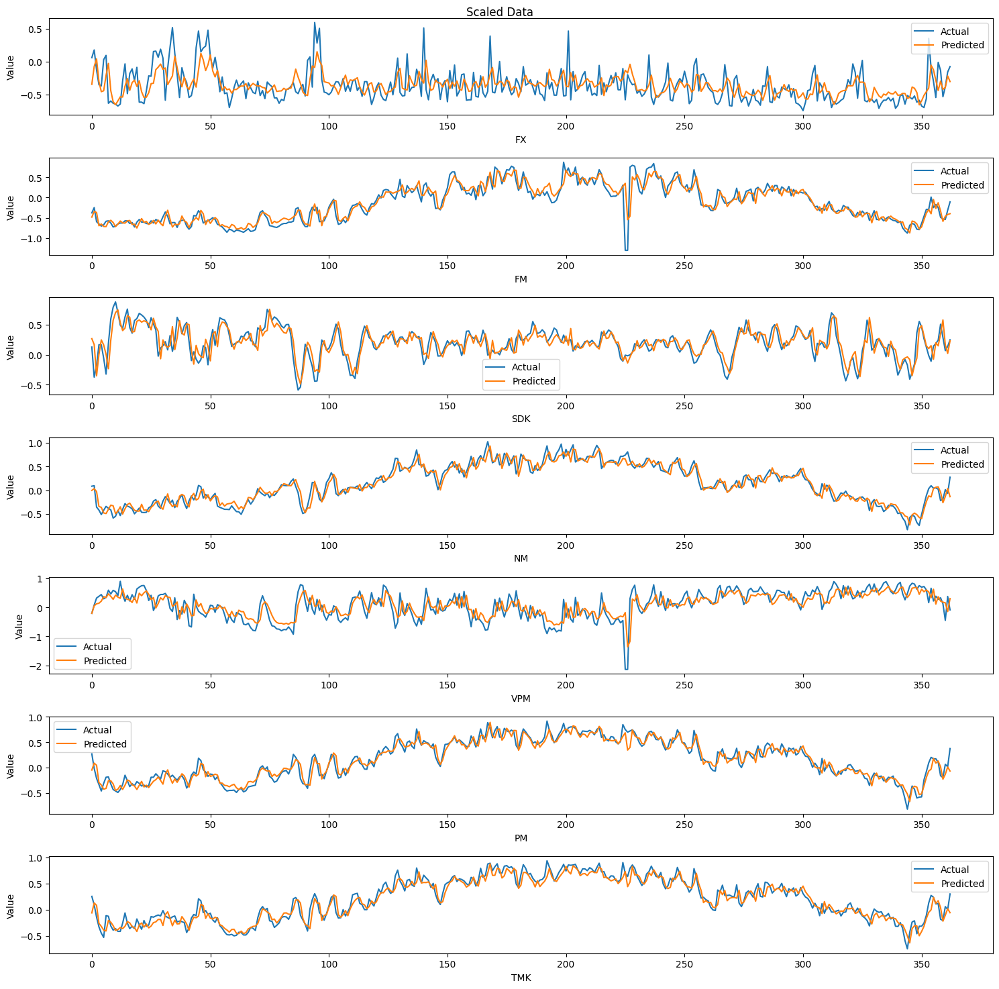

In [ ]:
plt.figure(figsize=(15, 15))
for i in range(num_outputs):
    plt.subplot(num_outputs, 1, i+1)
    plt.plot(testY[:, i], label='Actual')
    plt.plot(pred_VARNN[:, i], label='Predicted')
    plt.title('')
    plt.xlabel(f'{scaled_test.columns[i]}')
    plt.ylabel('Value')
    plt.legend()
    
plt.suptitle('Scaled Data')
plt.tight_layout()
plt.show()

#### Unscaled data

In [ ]:
def unscale(data):
    temp = data.copy()
    for index, i in enumerate(VAR_train.columns):
        scaler = scalers['scaler_' + i]
        temp[:, index] = scaler.inverse_transform(np.reshape(data[:, index], (-1, 1))).flatten()
    return temp

In [ ]:
unscaled_VARNN = unscale(pred_VARNN)
originY = unscale(testY)

In [ ]:
for i in range(num_outputs):
    print(f'MSE for {scaled_test.columns[i]}: {mean_squared_error(originY[:, i], unscaled_VARNN[:, i])}')
    
print(f'MSE total: {mean_squared_error(originY, unscaled_VARNN)}')

MSE for FX: 14.050112205478367
MSE for FM: 2.715208354282622
MSE for SDK: 15.693765413857268
MSE for NM: 5.038118214067479
MSE for VPM: 93.24258044305002
MSE for PM: 3.599939828725637
MSE for TMK: 3.988001343632402
MSE total: 19.761103686156254


In [ ]:
for i in range(num_outputs):
    print(f'RMSE for {scaled_test.columns[i]}: {mean_squared_error(originY[:, i], unscaled_VARNN[:, i], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(originY, unscaled_VARNN, squared=False)}')

RMSE for FX: 3.748347930152478
RMSE for FM: 1.647788928923429
RMSE for SDK: 3.9615357393133874
RMSE for NM: 2.244575285898755
RMSE for VPM: 9.656219780175368
RMSE for PM: 1.897350739511711
RMSE for TMK: 1.9969980830317295
RMSE total: 3.593259498143837


In [ ]:
for i in range(num_outputs):
    print(f'MAE for {scaled_test.columns[i]}: {mean_absolute_error(originY[:, i], unscaled_VARNN[:, i])}')
    
print(f'MAE total: {mean_absolute_error(originY, unscaled_VARNN)}')

MAE for FX: 2.8417999209779685
MAE for FM: 1.0716006179158024
MAE for SDK: 3.0053620343168856
MAE for NM: 1.7467442706596752
MAE for VPM: 7.415600088450534
MAE for PM: 1.4427914383757048
MAE for TMK: 1.5561187323857582
MAE total: 2.7257167290117614


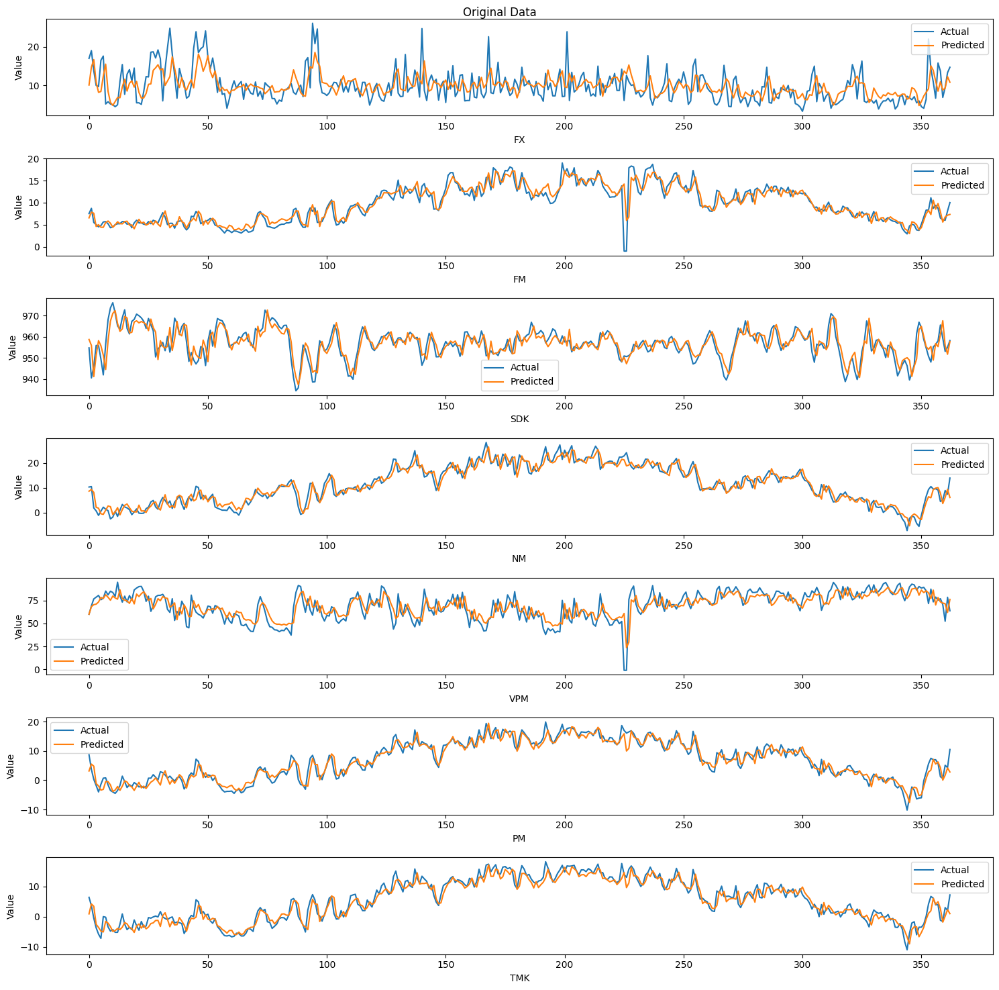

In [ ]:
plt.figure(figsize=(15, 15))
for i in range(num_outputs):
    plt.subplot(num_outputs, 1, i+1)
    plt.plot(originY[:, i], label='Actual')
    plt.plot(unscaled_VARNN[:, i], label='Predicted')
    plt.title('')
    plt.xlabel(f'{scaled_test.columns[i]}')
    plt.ylabel('Value')
    plt.legend()
    
plt.suptitle('Original Data')
plt.tight_layout()
plt.show()

## SrVAR
### Define model

In [ ]:
class LSTMEncoder(nn.Module):
    def __init__(self, input_dim, hidden_dim):
        super(LSTMEncoder, self).__init__()
        self.lstm = nn.LSTM(input_dim, hidden_dim, batch_first=True)

    def forward(self, x):
        _, (h_n, _) = self.lstm(x)
        return h_n[-1]  # Vector trạng thái cuối

In [ ]:
class StateRegularizedUnit(nn.Module):
    def __init__(self, hidden_dim, num_states, tau=1.0):
        super(StateRegularizedUnit, self).__init__()
        self.state_encodings = nn.Parameter(torch.randn(num_states, hidden_dim))
        self.tau = tau

    def forward(self, u_t):
        # Tính điểm gần gũi (Proximity scores)
        proximity_scores = torch.matmul(u_t, self.state_encodings.T)  # Công thức (2) 
        alpha = torch.softmax(proximity_scores / self.tau, dim=-1)  # Công thức (4) 

        # Tính trạng thái h_t dựa trên phân phối alpha
        h_t = torch.matmul(alpha, self.state_encodings)  # Công thức (5)

        # Tính entropy regularization
        entropy_reg = -torch.sum(alpha * torch.log(alpha + 1e-10), dim=-1).mean() # Công thức (6)

        return h_t, alpha, entropy_reg

In [ ]:
class GraphGeneration(nn.Module):
    def __init__(self, hidden_dim, num_vars):
        super(GraphGeneration, self).__init__()
        self.g_a = nn.Linear(hidden_dim, num_vars * num_vars)
        self.g_d = nn.Linear(hidden_dim, num_vars)

    def forward(self, c_st):
        # Sinh ma trận DAG (Adjacency matrix A_st)
        A_st = self.g_a(c_st).view(-1, num_vars, num_vars)  # Công thức (10)

        # Sinh ma trận time-lagged (Diagonal matrix D_st)
        D_st = torch.diag_embed(self.g_d(c_st))  # Công thức (11)

        # Ràng buộc tính không chu kỳ (Acyclicity constraint)
        exp_A = torch.matrix_exp(A_st * A_st)  # Tính ma trận mũ của A_st * A_st, nếu có chu kì thì exp_A sẽ cao [batch_size, num_vars, num_vars]
        trace_exp_A = torch.sum(torch.diagonal(exp_A, dim1=-2, dim2=-1), dim=-1)  # Tính trace cho từng ma trận trong batch [batch_size,] = torch.trace
        acyclic_penalty = torch.mean(trace_exp_A - A_st.size(-1))  # Tổng hợp thành scalar [batch_sỉze]

        return A_st, D_st, acyclic_penalty

In [ ]:
class DynamicVAR(nn.Module):
    def __init__(self, num_vars):
        super(DynamicVAR, self).__init__()
        self.var_weights = nn.Parameter(torch.randn(num_vars, num_vars))

    def forward(self, x_t, A_st, D_st):
        batch_size = x_t.size(0)
        x_t = x_t.unsqueeze(-1)

        # Tính toán từ ma trận adjacency (x_hat_A)
        x_hat_A = torch.matmul(A_st, x_t).squeeze(-1)

        # Tính toán từ ma trận time-lagged (x_hat_D)
        weighted_x_t = torch.matmul(self.var_weights, x_t.squeeze(-1).unsqueeze(-1)).squeeze(-1)
        x_hat_D = torch.matmul(D_st, weighted_x_t.unsqueeze(-1)).squeeze(-1)

        # Tổng hợp dự đoán
        x_hat = x_hat_A + x_hat_D
        return x_hat

In [ ]:
class SrVARModel(nn.Module):
    def __init__(self, input_dim, hidden_dim, num_states, num_vars, tau=10.0):
        super(SrVARModel, self).__init__()
        self.encoder = LSTMEncoder(input_dim, hidden_dim)
        self.state_regularized_unit = StateRegularizedUnit(hidden_dim, num_states, tau)
        self.graph_generation = GraphGeneration(hidden_dim, num_vars)
        self.dynamic_var = DynamicVAR(num_vars)

    def forward(self, x):
        u_t = self.encoder(x)  # Bước 1
        h_t, alpha, entropy_reg = self.state_regularized_unit(u_t)  # Bước 2
        A_st, D_st, acyclic_penalty = self.graph_generation(h_t)  # Bước 3
        x_hat = self.dynamic_var(x[:, -1, :], A_st, D_st)  # Bước 4

        return x_hat, alpha, entropy_reg, acyclic_penalty

In [ ]:
def train_srvarm(model, trainX, trainY, valX, valY, num_epochs=100, batch_size=32, lr=0.001, tau=1.0, verbose=0):

    # Optimizer và Loss function
    optimizer = optim.Adam(model.parameters(), lr=lr)
    mse_loss = nn.MSELoss()

    # Lagrangian parameters
    rho = 1.0
    lagrangian_multiplier = 0.0
    max_rho = 10.0

    # Lưu lịch sử mất mát
    train_loss_history = []
    val_loss_history = []

    for epoch in range(num_epochs):
        model.train()
        train_epoch_loss = 0

        # Huấn luyện
        for i in range(0, len(trainX), batch_size):
            # Lấy batch và chuyển về device
            batch_x = torch.tensor(trainX[i:i + batch_size], dtype=torch.float32)
            batch_y = torch.tensor(trainY[i:i + batch_size], dtype=torch.float32)

            # Forward pass
            x_hat, alpha, entropy_reg, acyclic_penalty = model(batch_x)

            # Tính hàm mất mát
            loss = (
                mse_loss(x_hat, batch_y)
                + 0.01 * entropy_reg
                + rho / 2 * acyclic_penalty.pow(2).mean()
                + lagrangian_multiplier * acyclic_penalty.mean()
            )

            # Backward pass và update
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()

            train_epoch_loss += loss.item()

        # Tính mất mát trung bình trên tập huấn luyện
        train_avg_loss = train_epoch_loss / (len(trainX) / batch_size)
        train_loss_history.append(train_avg_loss)

        # Đánh giá trên tập validation
        model.eval()
        val_epoch_loss = 0
        with torch.no_grad():
            for i in range(0, len(valX), batch_size):
                batch_val_x = torch.tensor(valX[i:i + batch_size], dtype=torch.float32)
                batch_val_y = torch.tensor(valY[i:i + batch_size], dtype=torch.float32)

                # Forward pass
                x_hat, alpha, entropy_reg, acyclic_penalty = model(batch_val_x)

                # Tính hàm mất mát validation
                val_loss = mse_loss(x_hat, batch_val_y) + 0.01 * entropy_reg
                val_epoch_loss += val_loss.item()

        # Tính mất mát trung bình trên tập validation
        val_avg_loss = val_epoch_loss / (len(valX) / batch_size)
        val_loss_history.append(val_avg_loss)

        # Log thông tin
        if verbose == 1:
            if (epoch + 1) % 10 == 0:
                print(f"Epoch {epoch + 1}/{num_epochs}, Train Loss: {train_avg_loss:.4f}, Val Loss: {val_avg_loss:.4f}")

    return model, train_loss_history, val_loss_history

In [ ]:
# Chia dữ liệu thành train và validation
Xtrain, valX, Ytrain, valY = train_test_split(trainX, trainY, test_size=0.2, random_state=42)

input_dim = trainX.shape[2]
hidden_dim = 64
num_vars = trainX.shape[2]

for num_states in range(1, 6):
    model = SrVARModel(input_dim=input_dim, hidden_dim=hidden_dim, num_states=num_states, num_vars=num_vars)
    trained_model_SrVAR, train_loss_history_SrVAR, val_loss_history_SrVAR = train_srvarm(
        model, Xtrain, Ytrain, valX, valY, num_epochs=100, batch_size=32, lr=0.001, tau=1.0, verbose=0
    )

    print(f"num_states: {num_states}, train_loss: {train_loss_history_SrVAR[-1]}, val_loss: {val_loss_history_SrVAR[-1]}")

num_states: 1, train_loss: 0.062060033098310874, val_loss: 0.04108637652985037
num_states: 2, train_loss: 0.033147936164053725, val_loss: 0.03821115073275893
num_states: 3, train_loss: 0.03468603550620345, val_loss: 0.03974573416252659
num_states: 4, train_loss: 0.03306145008029856, val_loss: 0.03782980144023895
num_states: 5, train_loss: 0.0349470269014907, val_loss: 0.04058953833906618


In [ ]:
# Model parameters
num_states = 2

# Instantiate the model
model_SrVAR = SrVARModel(input_dim=input_dim, hidden_dim=hidden_dim, num_states=num_states, num_vars=num_vars)

start = time.time()
trained_model_SrVAR, train_loss_history_SrVAR, val_loss_history_SrVAR = train_srvarm(
    model_SrVAR, Xtrain, Ytrain, valX, valY, num_epochs=100, batch_size=32, lr=0.01, tau=1.0, verbose=1
)
end = time.time()

# Log training time
print(f"Training completed in {end - start:.2f} seconds")

Epoch 10/100, Train Loss: 0.0414, Val Loss: 0.0493
Epoch 20/100, Train Loss: 0.0410, Val Loss: 0.0483
Epoch 30/100, Train Loss: 0.0406, Val Loss: 0.0469
Epoch 40/100, Train Loss: 0.0400, Val Loss: 0.0476
Epoch 50/100, Train Loss: 0.0391, Val Loss: 0.0475
Epoch 60/100, Train Loss: 0.0384, Val Loss: 0.0469
Epoch 70/100, Train Loss: 0.0366, Val Loss: 0.0440
Epoch 80/100, Train Loss: 0.0345, Val Loss: 0.0431
Epoch 90/100, Train Loss: 0.0315, Val Loss: 0.0437
Epoch 100/100, Train Loss: 0.0294, Val Loss: 0.0443
Training completed in 21.90 seconds


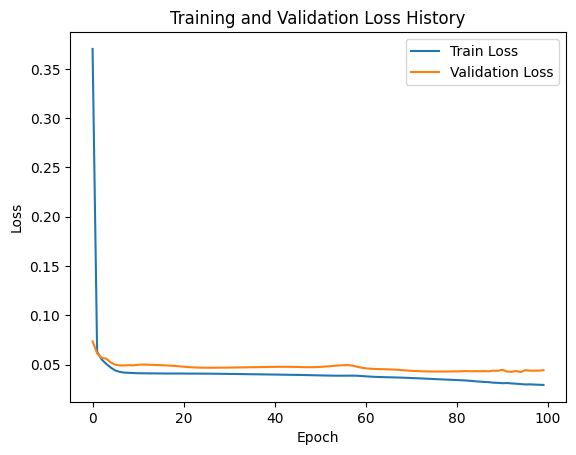

In [ ]:
plt.plot(train_loss_history_SrVAR, label="Train Loss")
plt.plot(val_loss_history_SrVAR, label="Validation Loss")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.title("Training and Validation Loss History")
plt.legend()
plt.show()

In [ ]:
model_SrVAR.eval()  # Đặt mô hình ở chế độ đánh giá
predictions_SrVAR = []
batch_size = 32
n_features = 7

with torch.no_grad():  # Không cần tính gradient trong chế độ dự đoán
    for i in range(0, len(testX), batch_size):
        # Lấy batch từ testX và chuyển về device
        batch_x = torch.tensor(testX[i:i+batch_size], dtype=torch.float32)

        # Dự đoán với mô hình
        batch_pred, _, _, _ = model_SrVAR(batch_x)  # Nếu forward của model trả về nhiều giá trị

        # Chuyển kết quả về CPU và thêm vào danh sách predictions
        predictions_SrVAR.append(batch_pred.cpu().numpy())

# Kết hợp danh sách predictions thành một mảng numpy
predictions_SrVAR = np.concatenate(predictions_SrVAR, axis=0)

In [ ]:
for i in range(n_features):
    print(f'MSE for {scaled_test.columns[i]}: {mean_squared_error(testY[:, i], predictions_SrVAR[:, i])}')
    
print(f'MSE total: {mean_squared_error(testY, predictions_SrVAR)}')

MSE for FX: 0.0536727862550178
MSE for FM: 0.03794583368148822
MSE for SDK: 0.02485275963898603
MSE for NM: 0.01895228095629683
MSE for VPM: 0.1116693586941751
MSE for PM: 0.012721179053258466
MSE for TMK: 0.015356270364748006
MSE total: 0.03931006694913863


In [ ]:
for i in range(n_features):
    print(f'RMSE for {scaled_test.columns[i]}: {mean_squared_error(testY[:, i], predictions_SrVAR[:, i], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(testY, predictions_SrVAR, squared=False)}')

RMSE for FX: 0.23167387909520099
RMSE for FM: 0.19479690367531055
RMSE for SDK: 0.1576475805047005
RMSE for NM: 0.13766728353641916
RMSE for VPM: 0.33416965555564004
RMSE for PM: 0.11278820440657111
RMSE for TMK: 0.12392041948261798
RMSE total: 0.18466627517949433


In [ ]:
for i in range(n_features):
    print(f'MAE for {scaled_test.columns[i]}: {mean_absolute_error(testY[:, i], predictions_SrVAR[:, i])}')
    
print(f'MAE total: {mean_absolute_error(testY, predictions_SrVAR)}')

MAE for FX: 0.17226892135834515
MAE for FM: 0.12328749727861571
MAE for SDK: 0.1235535724490708
MAE for NM: 0.10795944005203055
MAE for VPM: 0.2572714808163311
MAE for PM: 0.08672710066484123
MAE for TMK: 0.0954624725778435
MAE total: 0.13807578359958259


In [ ]:
for i in range(n_features):
    print(f'R2 for {scaled_test.columns[i]}: {r2_score(testY[:, i], predictions_SrVAR[:, i])}')
    
print(f'R2 total: {r2_score(testY, predictions_SrVAR)}')

R2 for FX: 0.14354159921129717
R2 for FM: 0.8125741267328999
R2 for SDK: 0.5936228172614234
R2 for NM: 0.8813377821534237
R2 for VPM: 0.5090833802910544
R2 for PM: 0.9125679369488566
R2 for TMK: 0.9020015672772828
R2 total: 0.6792470299823199


In [ ]:
unscaled_SrVAR = unscale(predictions_SrVAR)
originY = unscale(testY)

In [ ]:
for i in range(n_features):
    print(f'MSE for {scaled_test.columns[i]}: {mean_squared_error(originY[:, i], unscaled_SrVAR[:, i])}')
    
print(f'MSE total: {mean_squared_error(originY, unscaled_SrVAR)}')

MSE for FX: 15.511435159830715
MSE for FM: 3.2117353097573713
MSE for SDK: 20.115869390132914
MSE for NM: 6.913981814104767
MSE for VPM: 110.80391736604047
MSE for PM: 3.851464367509536
MSE for TMK: 4.622582779976112
MSE total: 23.575855169621708


In [ ]:
for i in range(n_features):
    print(f'RMSE for {scaled_test.columns[i]}: {mean_squared_error(originY[:, i], unscaled_SrVAR[:, i], squared=False)}')
    
print(f'RMSE total: {mean_squared_error(originY, unscaled_SrVAR, squared=False)}')

RMSE for FX: 3.938455936002168
RMSE for FM: 1.792131499013778
RMSE for SDK: 4.485071837789548
RMSE for NM: 2.6294451532794456
RMSE for VPM: 10.526343969586044
RMSE for PM: 1.9625148069529401
RMSE for TMK: 2.1500192510710483
RMSE total: 3.926283207670711


In [ ]:
for i in range(n_features):
    print(f'MAE for {scaled_test.columns[i]}: {mean_absolute_error(originY[:, i], unscaled_SrVAR[:, i])}')
    
print(f'MAE total: {mean_absolute_error(originY, unscaled_SrVAR)}')

MAE for FX: 2.9285716412481198
MAE for FM: 1.1342449798810579
MAE for SDK: 3.5150956452845175
MAE for NM: 2.062025335344894
MAE for VPM: 8.104051513671875
MAE for PM: 1.5090516065968298
MAE for TMK: 1.65627386834432
MAE total: 2.9870449414816598


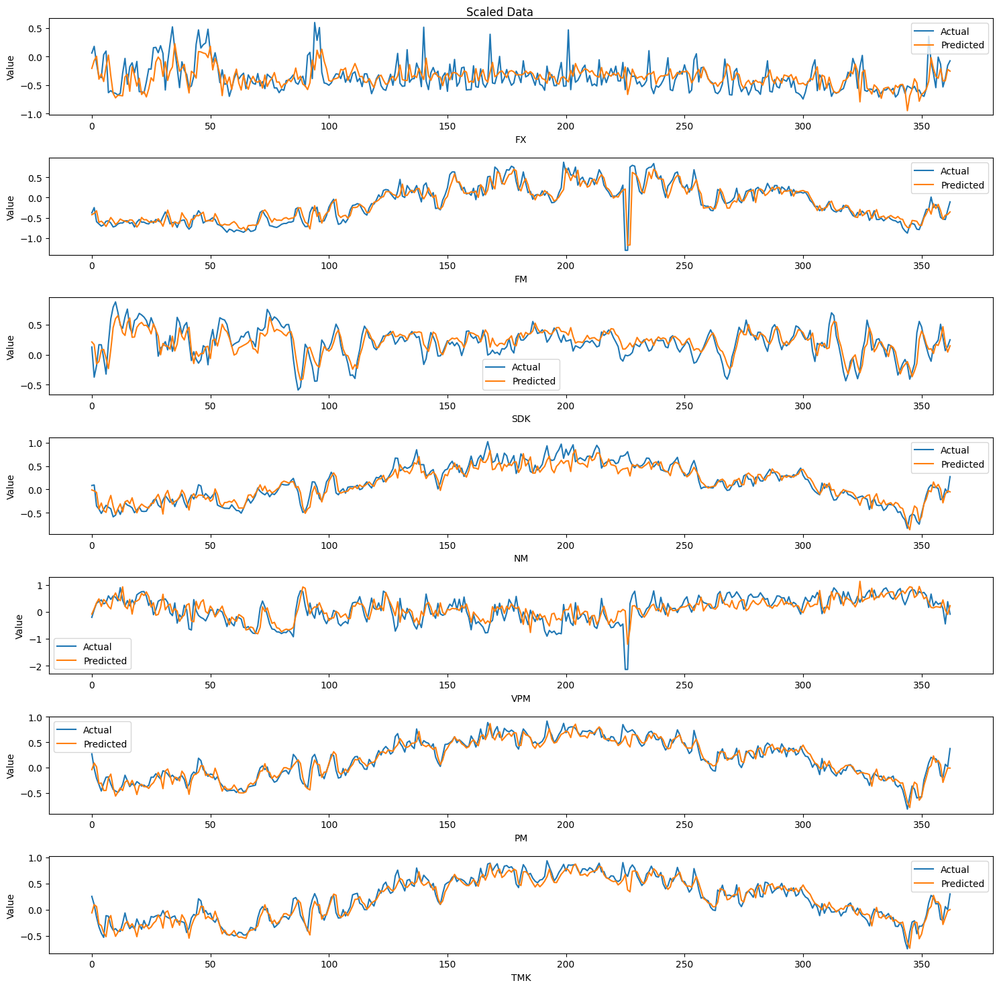

In [ ]:
plt.figure(figsize=(15, 15))
for i in range(n_features):
    plt.subplot(n_features, 1, i+1)
    plt.plot(testY[:, i], label='Actual')
    plt.plot(predictions_SrVAR[:, i], label='Predicted')
    plt.title('')
    plt.xlabel(f'{scaled_test.columns[i]}')
    plt.ylabel('Value')
    plt.legend()
    
plt.suptitle('Scaled Data')
plt.tight_layout()
plt.show()

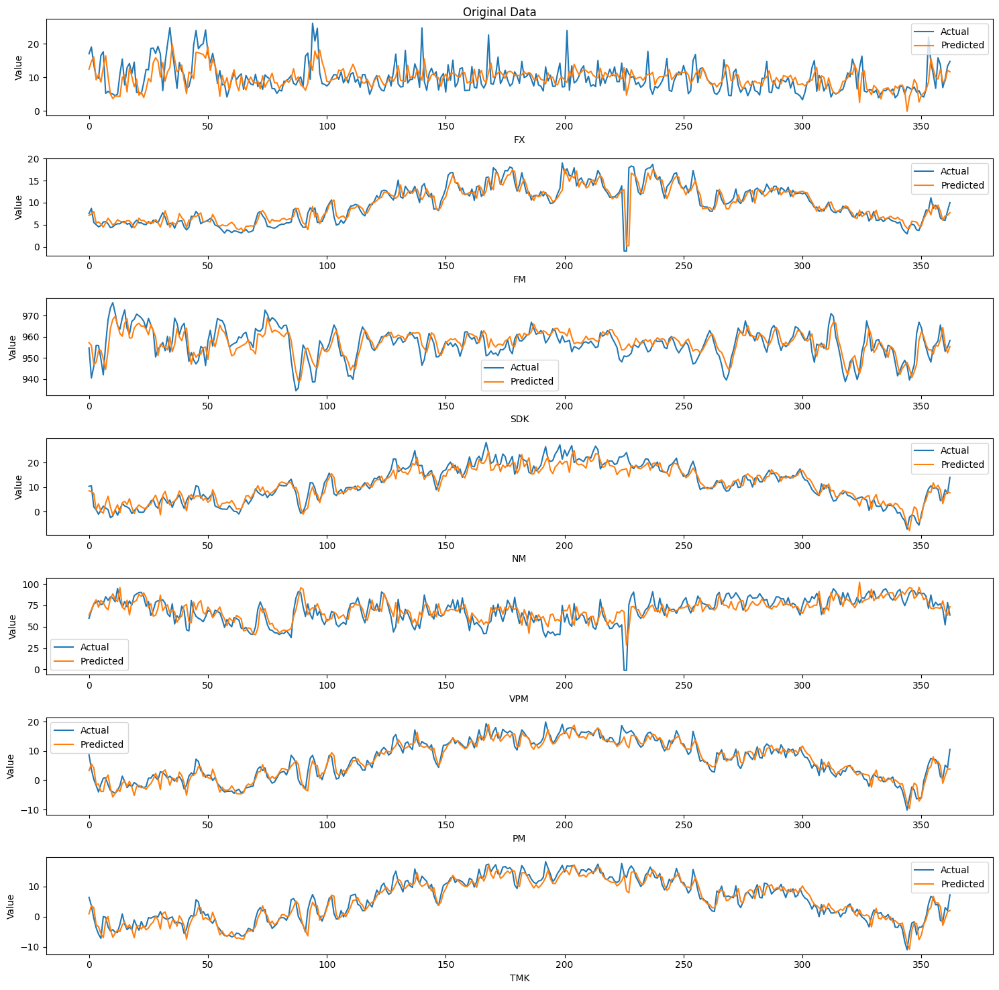

In [ ]:
plt.figure(figsize=(15, 15))
for i in range(n_features):
    plt.subplot(n_features, 1, i+1)
    plt.plot(originY[:, i], label='Actual')
    plt.plot(unscaled_SrVAR[:, i], label='Predicted')
    plt.title('')
    plt.xlabel(f'{scaled_test.columns[i]}')
    plt.ylabel('Value')
    plt.legend()
    
plt.suptitle('Original Data')
plt.tight_layout()
plt.show()